In [1]:
# import geopandas as gpd

In [ ]:
# conda install -c conda-forge descartes
# import sys
# # !conda install geopandas
# # import sys
# !{sys.executable} -m pip install geopandas
# sys.executable
# !conda install seaborn

In [3]:
# extra_path = os.path.join(sys.prefix, 'site-packages')
# if os.path.isdir(extra_path) and extra_path not in sys.path:
#     sys.path.append(extra_path)

In [180]:
from math import radians, cos, sin, asin, sqrt, atan2
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
# from pylab import rcParams
# import seaborn as sns
# import folium
# import spectra
import geopandas as gpd
from shapely.geometry import Point, LineString, Polygon
import warnings
warnings.filterwarnings('ignore')

In [181]:
roads_path = "C:\\Users\\lilyx\\Snow\\geo_export_f228d8dc-f743-4360-a2cd-bcbfc02c0375.shp"
roads = gpd.read_file(roads_path, encoding='utf-8')
roads.shape

(109583, 10)

In [182]:
roads = roads.sample(109583)

In [183]:
roads['snow_prior'] = roads['snow_prior'].replace({"C": "Critical Routes: Highways, bus routes that connect to Hospitals, EMS, FDNY, NYPD and schools", "V":"Not serviced during snow events by DSNY.", "S":"Sector Routes: Streets wide enough for a full size trash truck with a plow attached.", "H":"Haulster Routes: Dead ends and streets that cannot be serviced with truck."})
roads = roads.sort_values("borough")
roads.head()

,borough,district,objectid,physical_i,roadway_ty,segment_le,shape_leng,snow_prior,street_nam,geometry
93887,BKN,BKN03,93891.0,43352.0,1.0,260.205226,260.204952,"Critical Routes: Highways, bus routes that connect to Hospitals, EMS, FDNY, NYPD and schools",ATLANTIC AV,"LINESTRING (-73.92754 40.67734, -73.92714 40.67731, -73.92702 40.67730, -73.92660 40.67728)"
19440,BKN,BKN02,21444.0,43072.0,1.0,172.778190,172.778141,Haulster Routes: Dead ends and streets that cannot be serviced with truck.,HENRY ST,"LINESTRING (-73.99462 40.69413, -73.99483 40.69368)"
73576,BKN,BKN05,73580.0,46299.0,1.0,260.204978,260.204863,"Critical Routes: Highways, bus routes that connect to Hospitals, EMS, FDNY, NYPD and schools",LINDEN BLVD,"LINESTRING (-73.87991 40.66299, -73.87978 40.66305, -73.87911 40.66337)"
103791,BKN,BKN05,102795.0,149804.0,1.0,472.555129,472.555042,"Critical Routes: Highways, bus routes that connect to Hospitals, EMS, FDNY, NYPD and schools",GRANT AV,"LINESTRING (-73.86578 40.67761, -73.86551 40.67651, -73.86546 40.67634)"
95158,BKN,BKN05,92162.0,74016.0,1.0,230.170203,230.170205,"Critical Routes: Highways, bus routes that connect to Hospitals, EMS, FDNY, NYPD and schools",BELMONT AV,"LINESTRING (-73.88470 40.67224, -73.88389 40.67236)"


In [184]:
roads['borough_condensed'] = roads['borough'].replace({"BKN":"BK","BKS":"BK","QE":"QN","QW":"QN"})

In [185]:
num_roads = roads['borough_condensed'].value_counts()
num_roads = num_roads.as_matrix()
num_roads = num_roads.reshape((5,1))
num_roads

array([[41747],
       [24963],
       [16091],
       [15232],
       [11550]], dtype=int64)

<Figure size 5400x4800 with 0 Axes>

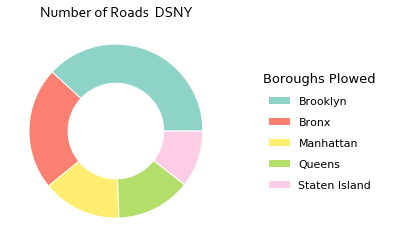

In [186]:
from matplotlib.pyplot import figure as fig
fig(num=None, figsize=(18, 16), dpi=300)
fig, ax = plt.subplots()

size = 0.45
vals = num_roads

cmap = plt.get_cmap("Set3")
outer_colors = cmap(np.array([0, 3, 11, 6, 7]))
# inner_colors = cmap(np.array([1, 2, 5, 6, 9, 10]))

ax.pie(vals.sum(axis=1), radius=1, colors=outer_colors,
       wedgeprops=dict(width=size, edgecolor='w'))

# ax.pie(vals.flatten(), radius=1-size, colors=inner_colors,
#        wedgeprops=dict(width=size, edgecolor='w'))

ingredients = ['Brooklyn',
          'Bronx',
          'Manhattan',
          'Queens',
          'Staten Island']
ax.legend(ingredients,
          title="Boroughs Plowed",
          title_fontsize=13,
          loc="center left",
          labelspacing=1,
          borderpad=3,
          bbox_to_anchor=(1, 0, 0.5, 1), frameon=False,fontsize=11)

ax.set_title(label='Number of Roads  DSNY',fontname="Corbel",fontsize=15)
plt.show()

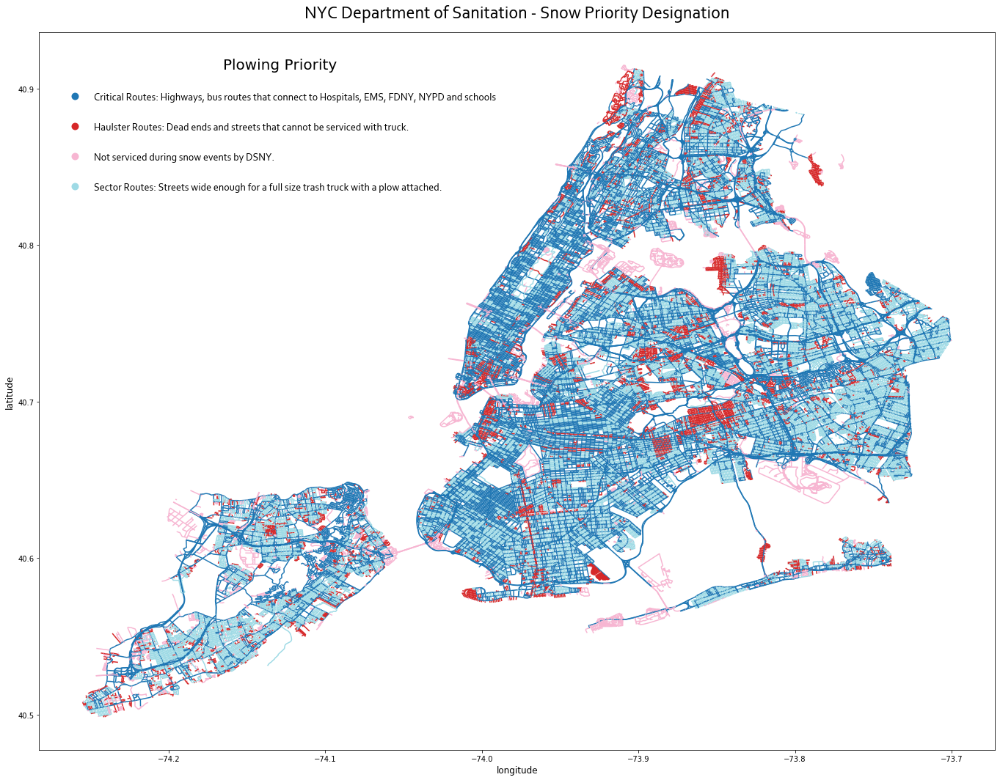

In [187]:
roads.plot(column='snow_prior',figsize=(24, 18), cmap = 'tab20', legend=True, legend_kwds={"frameon": False, "title": "Plowing Priority", "loc":"upper left", "title_fontsize":20, "mode":None,"labelspacing":2,"borderpad":2, "prop":{"family":"Corbel", "size":14}});
plt.title("NYC Department of Sanitation - Snow Priority Designation", fontdict={"family":"Corbel"}, pad=20, fontname="Corbel", size=24);
plt.ylabel("latitude", fontsize=12);
plt.xlabel("longitude", fontsize=12);

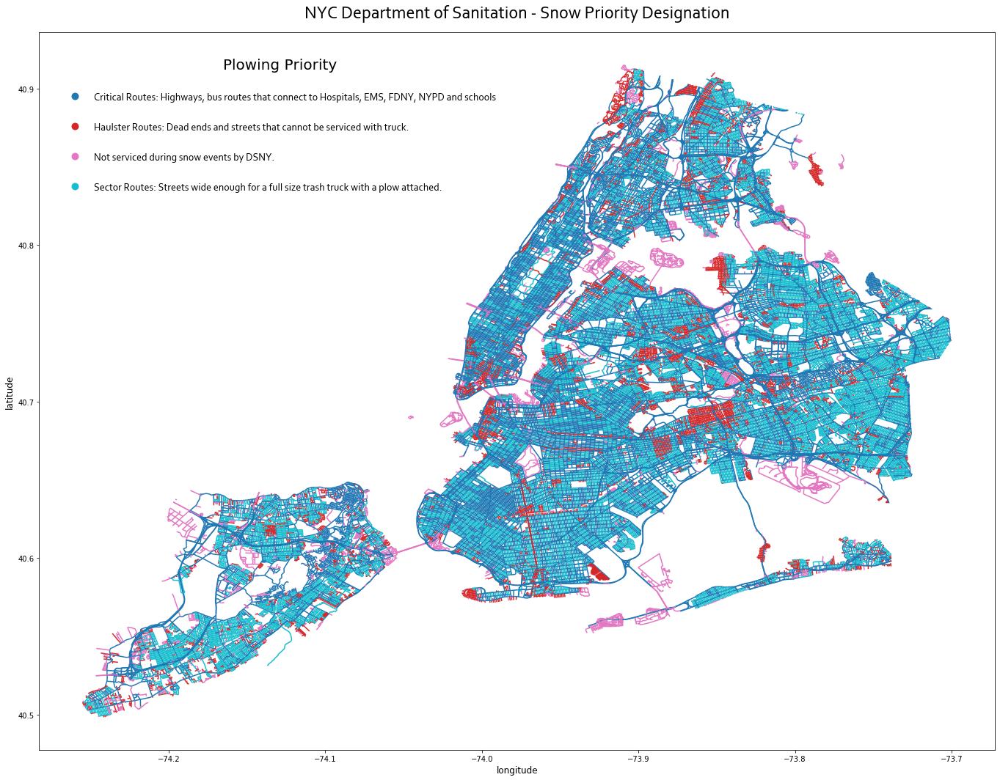

In [188]:
roads.plot(column='snow_prior',figsize=(24, 18), cmap = 'tab10', legend=True, legend_kwds={"frameon": False, "title": "Plowing Priority", "loc":"upper left", "title_fontsize":20, "mode":None,"labelspacing":2,"borderpad":2, "prop":{"family":"Corbel", "size":14}});
plt.title("NYC Department of Sanitation - Snow Priority Designation", fontdict={"family":"Corbel"}, pad=20, fontname="Corbel", size=24);
plt.ylabel("latitude", fontsize=12);
plt.xlabel("longitude", fontsize=12);

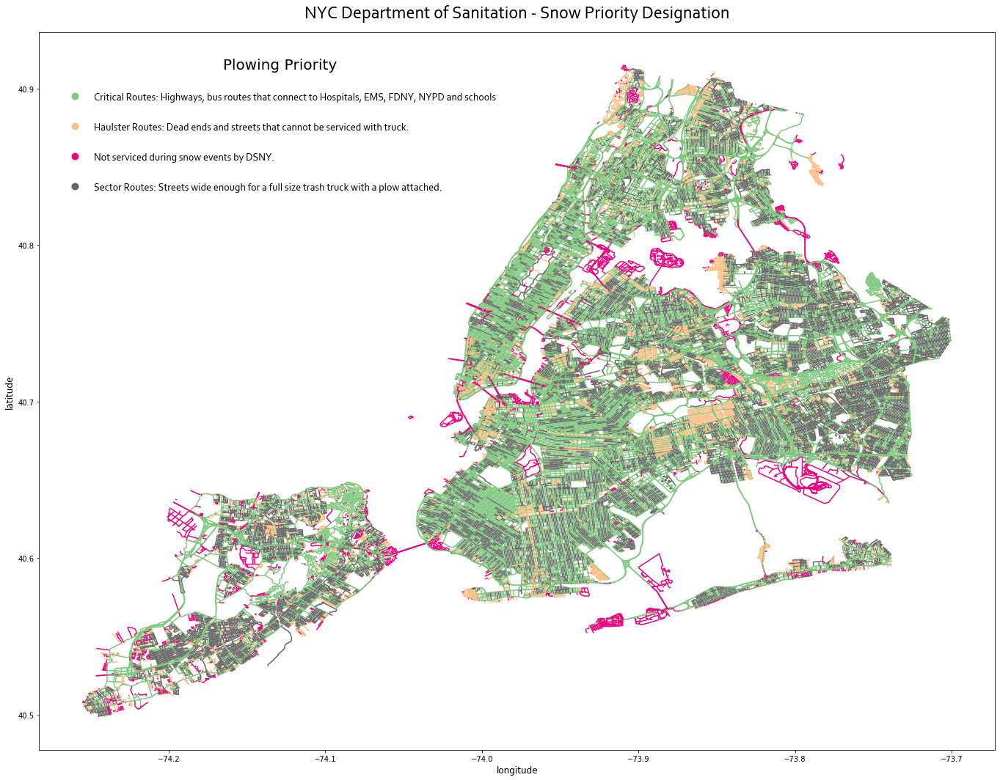

In [90]:
roads.plot(column='snow_prior',figsize=(24, 18), cmap = 'Accent', legend=True, legend_kwds={"frameon": False, "title": "Plowing Priority", "loc":"upper left", "title_fontsize":20, "mode":None,"labelspacing":2,"borderpad":2, "prop":{"family":"Corbel", "size":14}});
plt.title("NYC Department of Sanitation - Snow Priority Designation", fontdict={"family":"Corbel"}, pad=20, fontname="Corbel", size=24);
plt.ylabel("latitude", fontsize=12);
plt.xlabel("longitude", fontsize=12);
# plt.savefig('DSNY_Priority_Green.png',transparent=True)

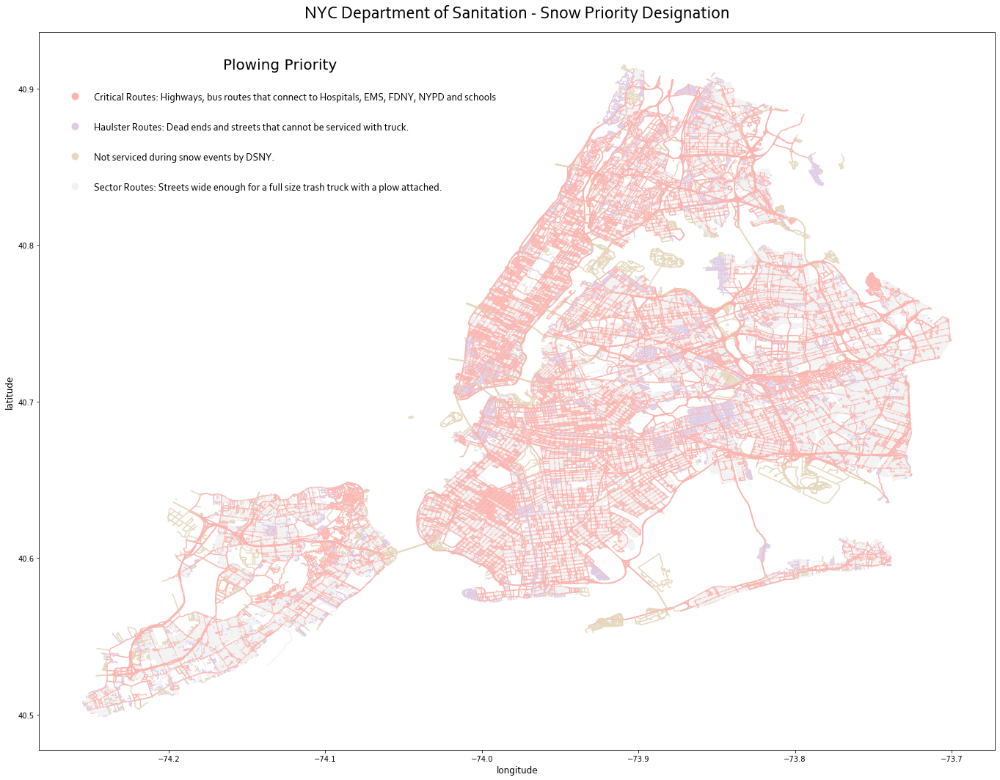

In [11]:
roads.plot(column='snow_prior',figsize=(24, 18), cmap = 'Pastel1', legend=True, legend_kwds={"frameon": False, "title": "Plowing Priority", "loc":"upper left", "title_fontsize":20, "mode":None,"labelspacing":2,"borderpad":2, "prop":{"family":"Corbel", "size":14}});
plt.title("NYC Department of Sanitation - Snow Priority Designation", fontdict={"family":"Corbel"}, pad=20, fontname="Corbel", size=24);
plt.ylabel("latitude", fontsize=12);
plt.xlabel("longitude", fontsize=12);

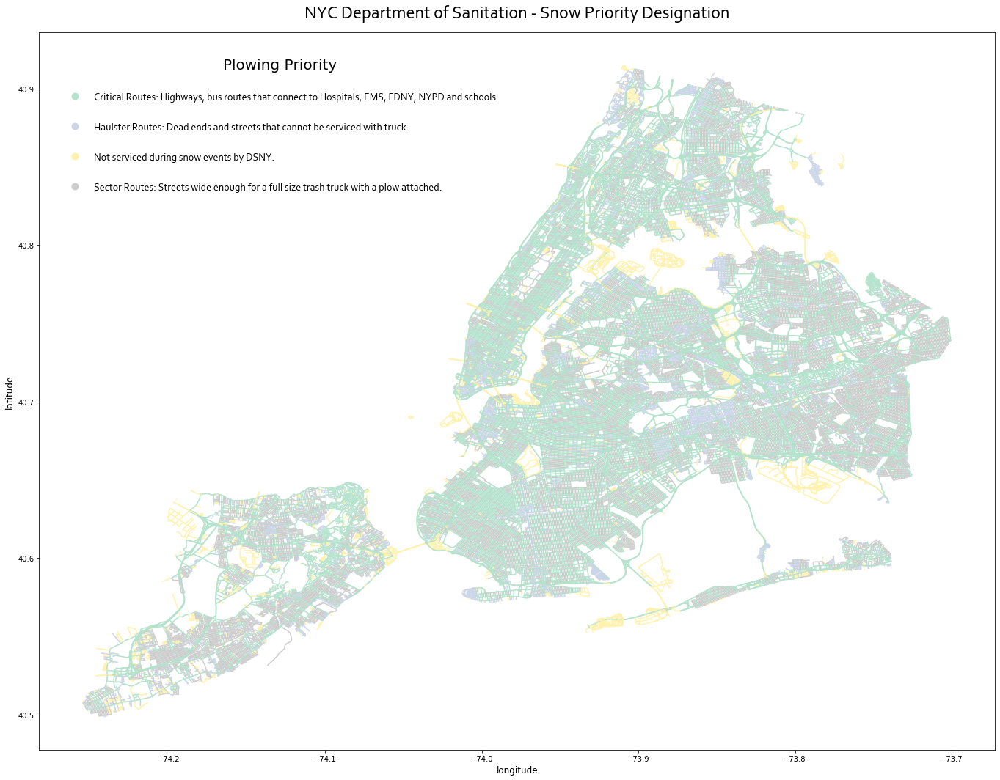

In [12]:
roads.plot(column='snow_prior',figsize=(24, 18), cmap = 'Pastel2', legend=True, legend_kwds={"frameon": False, "title": "Plowing Priority", "loc":"upper left", "title_fontsize":20, "mode":None,"labelspacing":2,"borderpad":2, "prop":{"family":"Corbel", "size":14}});
plt.title("NYC Department of Sanitation - Snow Priority Designation", fontdict={"family":"Corbel"}, pad=20, fontname="Corbel", size=24);
plt.ylabel("latitude", fontsize=12);
plt.xlabel("longitude", fontsize=12);

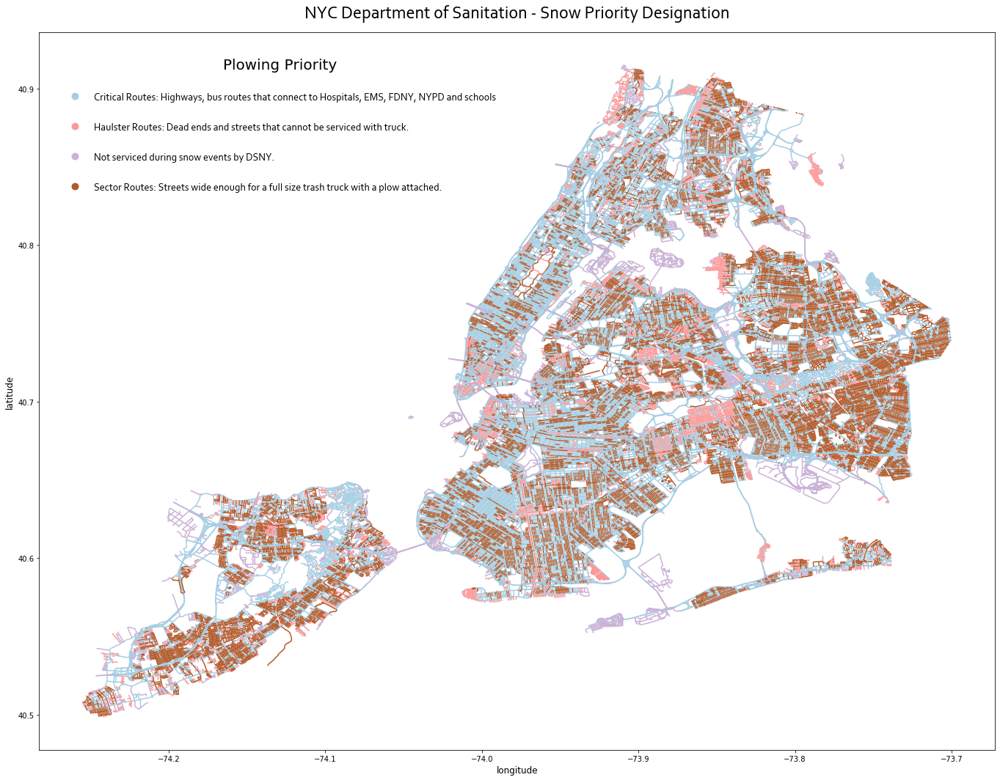

In [13]:
roads.plot(column='snow_prior',figsize=(24, 18), cmap = 'Paired', legend=True, legend_kwds={"frameon": False, "title": "Plowing Priority", "loc":"upper left", "title_fontsize":20, "mode":None,"labelspacing":2,"borderpad":2, "prop":{"family":"Corbel", "size":14}});
plt.title("NYC Department of Sanitation - Snow Priority Designation", fontdict={"family":"Corbel"}, pad=20, fontname="Corbel", size=24);
plt.ylabel("latitude", fontsize=12);
plt.xlabel("longitude", fontsize=12);

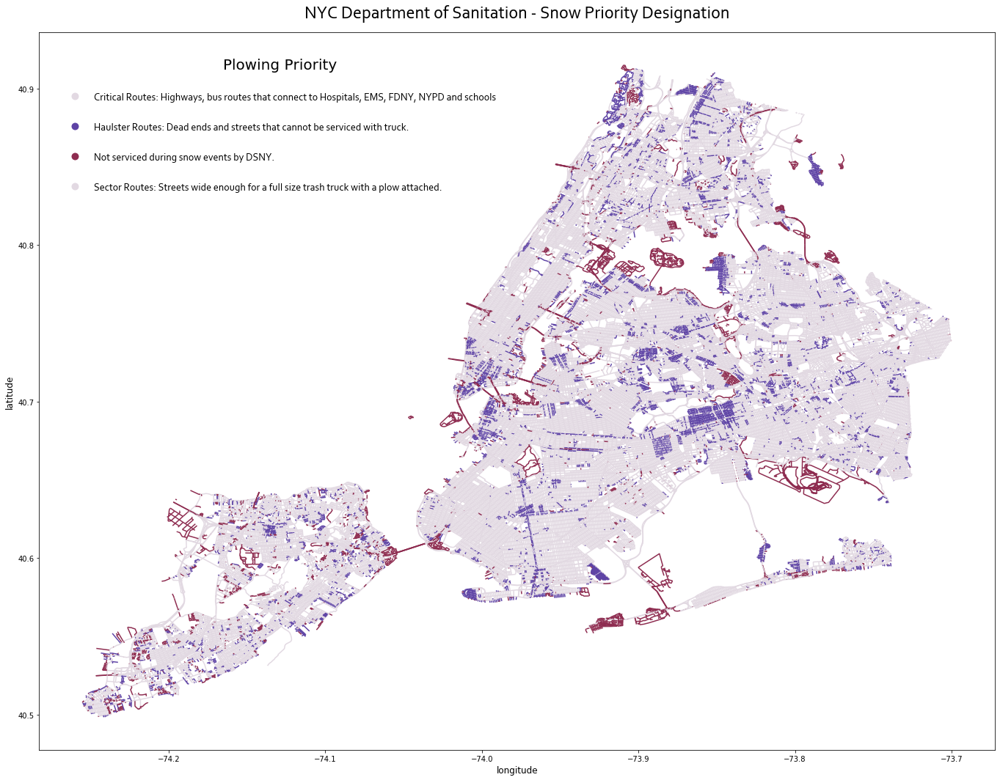

In [14]:
roads.plot(column='snow_prior',figsize=(24, 18), cmap = 'twilight', legend=True, legend_kwds={"frameon": False, "title": "Plowing Priority", "loc":"upper left", "title_fontsize":20, "mode":None,"labelspacing":2,"borderpad":2, "prop":{"family":"Corbel", "size":14}});
plt.title("NYC Department of Sanitation - Snow Priority Designation", fontdict={"family":"Corbel"}, pad=20, fontname="Corbel", size=24);
plt.ylabel("latitude", fontsize=12);
plt.xlabel("longitude", fontsize=12);
plt.savefig('DSNY_Priority_Purple.png',transparent=True)

In [18]:
# plt.savefig('DSNY_Priority_Purple.png',transparent=True)

<Figure size 432x288 with 0 Axes>

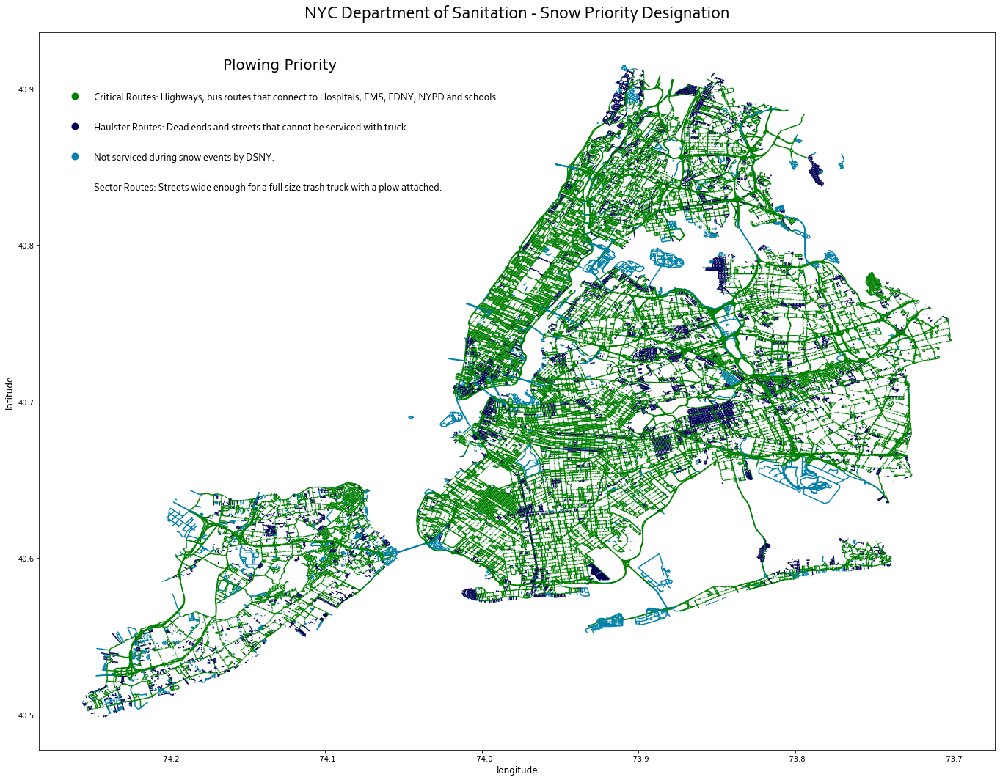

In [15]:
roads.plot(column='snow_prior',figsize=(24, 18), cmap = 'ocean', legend=True, legend_kwds={"frameon": False, "title": "Plowing Priority", "loc":"upper left", "title_fontsize":20, "mode":None,"labelspacing":2,"borderpad":2, "prop":{"family":"Corbel", "size":14}});
plt.title("NYC Department of Sanitation - Snow Priority Designation", fontdict={"family":"Corbel"}, pad=20, fontname="Corbel", size=24);
plt.ylabel("latitude", fontsize=12);
plt.xlabel("longitude", fontsize=12);

In [20]:
# plt.savefig('DSNY_Priority_Purple.png')

In [189]:
roadlength = roads.groupby('borough').sum()
roadlength = roadlength.reset_index()
roadlength

,borough,objectid,physical_i,roadway_ty,segment_le,shape_leng
0,BKN,6.168836e+08,8.263301e+08,12974.0,3.925997e+06,3.925997e+06
1,BKS,7.467663e+08,9.171387e+08,17425.0,5.230394e+06,5.230394e+06
2,BX,8.798593e+08,1.240216e+09,25514.0,5.381258e+06,5.381258e+06
3,MN,6.389830e+08,7.363075e+08,20696.0,3.576466e+06,3.576466e+06
4,QE,1.510451e+09,1.415271e+09,37517.0,9.638084e+06,9.638084e+06
5,QW,7.765704e+08,7.148105e+08,20254.0,4.755899e+06,4.755899e+06
6,SI,8.350874e+08,1.191315e+09,17519.0,5.504514e+06,5.504514e+06


In [190]:
roads['borough_condensed'] = roads['borough'].replace({"BKN":"BK","BKS":"BK","QE":"QN","QW":"QN"})
roadsByBorough = roads.groupby('borough_condensed').sum()
roadsByBorough = roadsByBorough.reset_index()

In [191]:
roadsByBorough['segment_le_miles'] = roadsByBorough['segment_le'] * 0.000189394
roadsByBorough

,borough_condensed,objectid,physical_i,roadway_ty,segment_le,shape_leng,segment_le_miles
0,BK,1.363650e+09,1.743469e+09,30399.0,9.156391e+06,9.156391e+06,1734.165550
1,BX,8.798593e+08,1.240216e+09,25514.0,5.381258e+06,5.381258e+06,1019.177953
2,MN,6.389830e+08,7.363075e+08,20696.0,3.576466e+06,3.576466e+06,677.361110
3,QN,2.287021e+09,2.130082e+09,57771.0,1.439398e+07,1.439398e+07,2726.134046
4,SI,8.350874e+08,1.191315e+09,17519.0,5.504514e+06,5.504514e+06,1042.521906


<Figure size 360x320 with 0 Axes>

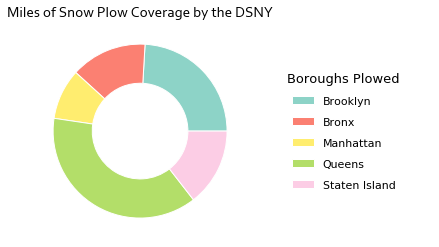

In [220]:
from matplotlib.pyplot import figure as fig
fig(num=None, figsize=(18, 16), dpi=20)
fig, ax = plt.subplots()

size = 0.45
vals = roadsByBorough[['borough_condensed','segment_le_miles']]

cmap = plt.get_cmap("Set3")
outer_colors = cmap(np.array([0, 3, 11, 6, 7]))
# inner_colors = cmap(np.array([1, 2, 5, 6, 9, 10]))

ax.pie(vals.sum(axis=1), radius=1, colors=outer_colors,
       wedgeprops=dict(width=size, edgecolor='w'))

# ax.pie(vals.flatten(), radius=1-size, colors=inner_colors,
#        wedgeprops=dict(width=size, edgecolor='w'))

ingredients = ['Brooklyn',
          'Bronx',
          'Manhattan',
          'Queens',
          'Staten Island']
ax.legend(ingredients,
          title="Boroughs Plowed",
          title_fontsize=13,
          loc="center left",
          labelspacing=1,
          borderpad=3,
          bbox_to_anchor=(1, 0, 0.5, 1), frameon=False,fontsize=11)

ax.set_title(label='Miles of Snow Plow Coverage by the DSNY',fontname="Corbel",fontsize=15)
plt.savefig('DSNY_Pie_Plowed_Miles.png',transparent=True)
plt.show()

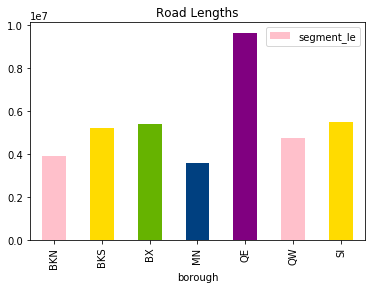

In [193]:
import matplotlib.colors as mcolors
clist = [(0, "pink"), (0.125, "orange"), (0.25, "yellow"), (0.5, "green"), 
         (0.7, "blue"), (0.75, "purple"), (1, "purple")]
rvb = mcolors.LinearSegmentedColormap.from_list("", clist)

N = 5
x = np.arange(N).astype(float)
y = np.random.uniform(0, 5, size=(N,))
roadlength.plot.bar(title="Road Lengths", x='borough', y='segment_le', color=rvb(x/N))

In [194]:
import pandas as pd
censusNTA= pd.read_csv("C:\\Users\\lilyx\\Snow\\Census_Demographics_at_the_Neighborhood_Tabulation_Area__NTA__level.csv")
censusNTA.head(2)

,Geographic Area - Borough,Geographic Area - 2010 Census FIPS County Code,Geographic Area - Neighborhood Tabulation Area (NTA)* Code,Geographic Area - Neighborhood Tabulation Area (NTA)* Name,Total Population 2000 Number,Total Population 2010 Number,Total Population Change 2000-2010 Number,Total Population Change 2000-2010 Percent
0,Bronx,5.0,BX01,Claremont-Bathgate,28149.0,31078.0,2929.0,10.4
1,Bronx,5.0,BX03,Eastchester-Edenwald-Baychester,35422.0,34517.0,-905.0,-2.6


In [195]:
censusNTA['ntacode'] = censusNTA['Geographic Area - Neighborhood Tabulation Area (NTA)* Code'].astype(str)
censusNTA.head(2)

,Geographic Area - Borough,Geographic Area - 2010 Census FIPS County Code,Geographic Area - Neighborhood Tabulation Area (NTA)* Code,Geographic Area - Neighborhood Tabulation Area (NTA)* Name,Total Population 2000 Number,Total Population 2010 Number,Total Population Change 2000-2010 Number,Total Population Change 2000-2010 Percent,ntacode
0,Bronx,5.0,BX01,Claremont-Bathgate,28149.0,31078.0,2929.0,10.4,BX01
1,Bronx,5.0,BX03,Eastchester-Edenwald-Baychester,35422.0,34517.0,-905.0,-2.6,BX03


In [196]:
shp_path = 'C:\\Users\\lilyx\\Snow\\NeighborhoodTabulationAreas\\geo_export_5cd5b8f2-18b7-4b74-9a9f-861c2ebfe4b1.shp'
shpNTA = gpd.read_file(shp_path)
# shp_shape = shp.to_crs({'init': 'epsg:4326'})
# shp_shape.boundary.plot()
shpNTA.head()

,boro_code,boro_name,county_fip,ntacode,ntaname,shape_area,shape_leng,geometry
0,3.0,Brooklyn,047,BK88,Borough Park,5.400502e+07,39247.228074,"POLYGON ((-73.97605 40.63128, -73.97717 40.63075, -73.97700 40.62987, -73.97685 40.62909, -73.97670 40.62835, -73.97658 40.62757, -73.97651 40.62729, -73.97645 40.62701, -73.97623 40.62598, -73.97726 40.62585, -73.97720 40.62510, -73.97711 40.62495, -73.97694 40.62405, -73.97683 40.62348, -73.97675 40.62301, -73.97657 40.62199, -73.97695 40.62163, -73.97705 40.62153, -73.97539 40.62077, -73.97682 40.61868, -73.97752 40.61768, -73.97785 40.61729, -73.97563 40.61595, -73.97537 40.61575, -73.97544 40.61611, -73.97548 40.61631, -73.97444 40.61642, -73.97336 40.61654, -73.97290 40.61415, -73.97..."
1,4.0,Queens,081,QN51,Murray Hill,5.248828e+07,33266.904811,"POLYGON ((-73.80379 40.77561, -73.80099 40.77539, -73.79865 40.77520, -73.79853 40.77519, -73.79823 40.77485, -73.79785 40.77442, -73.79772 40.77427, -73.79758 40.77414, -73.79742 40.77401, -73.79742 40.77401, -73.79742 40.77401, -73.79730 40.77393, -73.79724 40.77389, -73.79673 40.77361, -73.79652 40.77350, -73.79572 40.77307, -73.79566 40.77304, -73.79522 40.77267, -73.79507 40.77254, -73.79494 40.77240, -73.79481 40.77226, -73.79416 40.77152, -73.79395 40.77127, -73.79324 40.77047, -73.79318 40.77040, -73.79321 40.77034, -73.79342 40.76860, -73.79361 40.76722, -73.79396 40.76470, -73.79..."
2,4.0,Queens,081,QN27,East Elmhurst,1.972685e+07,19816.711538,"POLYGON ((-73.86110 40.76366, -73.85993 40.76220, -73.85967 40.76190, -73.85914 40.76142, -73.85912 40.76128, -73.85897 40.76116, -73.85880 40.76105, -73.85864 40.76094, -73.85846 40.76083, -73.85829 40.76073, -73.85811 40.76064, -73.85792 40.76055, -73.85774 40.76046, -73.85754 40.76038, -73.85735 40.76030, -73.85671 40.76004, -73.85656 40.75998, -73.85638 40.75991, -73.85604 40.75973, -73.85577 40.75954, -73.85553 40.75934, -73.85525 40.75915, -73.85507 40.75894, -73.85501 40.75888, -73.85464 40.75847, -73.85458 40.75839, -73.85450 40.75828, -73.85463 40.75831, -73.85477 40.75833, -73.85..."
3,4.0,Queens,081,QN07,Hollis,2.288777e+07,20976.335837,"POLYGON ((-73.75726 40.71814, -73.75589 40.71630, -73.75470 40.71471, -73.75408 40.71390, -73.75405 40.71388, -73.75401 40.71383, -73.75371 40.71332, -73.75361 40.71307, -73.75358 40.71299, -73.75318 40.71206, -73.75246 40.71032, -73.75184 40.70882, -73.75140 40.70775, -73.75121 40.70731, -73.75077 40.70632, -73.75047 40.70564, -73.75052 40.70563, -73.75205 40.70523, -73.75294 40.70500, -73.75382 40.70477, -73.75471 40.70454, -73.75561 40.70430, -73.75652 40.70406, -73.75741 40.70384, -73.75830 40.70360, -73.75918 40.70337, -73.76007 40.70314, -73.76096 40.70291, -73.76126 40.70360, -73.76..."
4,1.0,Manhattan,061,MN06,Manhattanville,1.064708e+07,17040.686548,"POLYGON ((-73.94608 40.82126, -73.94640 40.82057, -73.94672 40.81989, -73.94704 40.81921, -73.94735 40.81853, -73.94767 40.81786, -73.94801 40.81712, -73.94836 40.81637, -73.94868 40.81569, -73.94883 40.81536, -73.94901 40.81504, -73.94920 40.81472, -73.94941 40.81441, -73.94963 40.81410, -73.94963 40.81410, -73.94963 40.81410, -73.94986 40.81380, -73.95035 40.81316, -73.95093 40.81258, -73.95098 40.81252, -73.95151 40.81201, -73.95210 40.81144, -73.95354 40.81205, -73.95408 40.81228, -73.95520 40.81355, -73.95571 40.81414, -73.95626 40.81339, -73.95708 40.81429, -73.95711 40.81433, -73.95..."


In [197]:
shpNTA['ntacode'] = shpNTA['ntacode'].astype(str)
censusNTAshp = pd.merge(censusNTA,shpNTA, on='ntacode')
censusNTAshp.head(2)

,Geographic Area - Borough,Geographic Area - 2010 Census FIPS County Code,Geographic Area - Neighborhood Tabulation Area (NTA)* Code,Geographic Area - Neighborhood Tabulation Area (NTA)* Name,Total Population 2000 Number,Total Population 2010 Number,Total Population Change 2000-2010 Number,Total Population Change 2000-2010 Percent,ntacode,boro_code,boro_name,county_fip,ntaname,shape_area,shape_leng,geometry
0,Bronx,5.0,BX01,Claremont-Bathgate,28149.0,31078.0,2929.0,10.4,BX01,2.0,Bronx,005,Claremont-Bathgate,1.645162e+07,29972.777720,"POLYGON ((-73.89039 40.85469, -73.89069 40.85435, -73.89090 40.85412, -73.89217 40.85277, -73.89307 40.85325, -73.89432 40.85189, -73.89479 40.85108, -73.89407 40.85071, -73.89495 40.84910, -73.89558 40.84785, -73.89618 40.84666, -73.89536 40.84652, -73.89434 40.84649, -73.89409 40.84649, -73.89385 40.84647, -73.89361 40.84645, -73.89337 40.84640, -73.89290 40.84627, -73.89398 40.84470, -73.89464 40.84390, -73.89479 40.84372, -73.89482 40.84368, -73.89485 40.84365, -73.89538 40.84294, -73.89565 40.84304, -73.89591 40.84314, -73.89617 40.84326, -73.89642 40.84339, -73.89666 40.84352, -73.89..."
1,Bronx,5.0,BX03,Eastchester-Edenwald-Baychester,35422.0,34517.0,-905.0,-2.6,BX03,2.0,Bronx,005,Eastchester-Edenwald-Baychester,4.025679e+07,59164.999949,"POLYGON ((-73.82367 40.88990, -73.82268 40.88962, -73.82249 40.89010, -73.82326 40.88999, -73.82337 40.89108, -73.82285 40.89121, -73.82061 40.89061, -73.81957 40.89032, -73.81949 40.89029, -73.81941 40.89026, -73.81828 40.88985, -73.81761 40.88968, -73.81661 40.88943, -73.81602 40.88932, -73.81574 40.88920, -73.81533 40.88908, -73.81524 40.88906, -73.81517 40.88904, -73.81365 40.88868, -73.81243 40.88838, -73.81127 40.88810, -73.80990 40.88774, -73.80943 40.88764, -73.80872 40.88748, -73.80756 40.88711, -73.80638 40.88683, -73.80484 40.88647, -73.80453 40.88641, -73.80424 40.88634, -73.80..."


<Figure size 432x288 with 0 Axes>

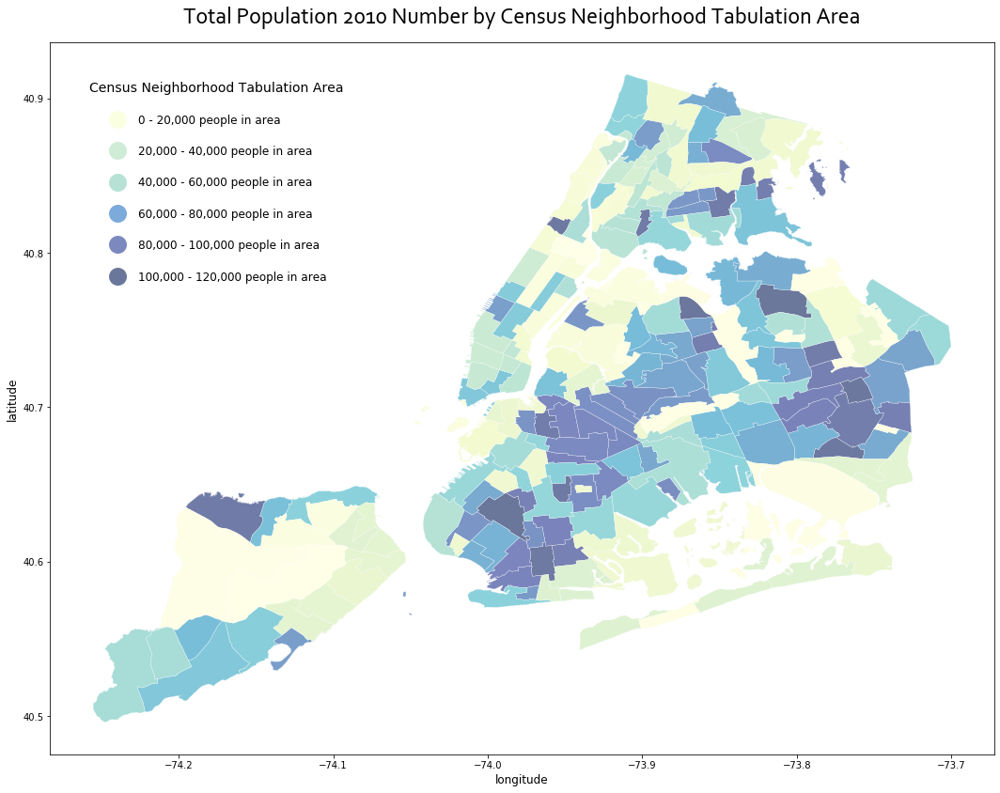

In [198]:
from descartes import PolygonPatch
import shapefile
from matplotlib.lines import Line2D


sf=shapefile.Reader('C:\\Users\\lilyx\\Snow\\NeighborhoodTabulationAreas\\geo_export_5cd5b8f2-18b7-4b74-9a9f-861c2ebfe4b1.shp')
fig = plt.figure() 
ax = shpNTA.plot(figsize=(18, 16), color='#EFEFEF', edgecolor='#ffffff', cmap='YlGnBu_r', column='Total Population 2010 Number',linewidth=0.2,label= "x",legend=True, legend_kwds={"frameon": False, "title": "Plowing Priority", "loc":"upper left", "title_fontsize":20,"mode":None,"labelspacing":2,"borderpad":2, "prop":{"family":"Corbel", "size":14},"bbox_to_anchor":(-0.5,.3,2,4)});

for poly in sf.shapes():
    poly_geo=poly.__geo_interface__
    ax.add_patch(PolygonPatch(poly_geo, fc='#ffffff', ec='#ffffff', alpha=0.4, linewidth=0.2))

ax.axis('scaled')
plt.title("Total Population 2010 Number by Census Neighborhood Tabulation Area", fontdict={"family":"Corbel"}, pad=20, fontname="Corbel", size=24);
plt.ylabel("latitude", fontsize=12);
plt.xlabel("longitude", fontsize=12);
line1 = Line2D(range(1), range(1), color="white", marker='o', markerfacecolor="#FAFFE2",markersize=20)
line2 = Line2D(range(1), range(1), color="white", marker='o',markerfacecolor="#CFECD6",markersize=20)
line3 = Line2D(range(1), range(1), color="white", marker='o', markerfacecolor="#B7E1D5",markersize=20)
line4 = Line2D(range(1), range(1), color="white", marker='o',markerfacecolor="#7CAADA",markersize=20)
line5 = Line2D(range(1), range(1), color="white", marker='o', markerfacecolor="#7C89BF",markersize=20)
line6 = Line2D(range(1), range(1), color="white", marker='o',markerfacecolor="#6B779A",markersize=20)
ax.legend((line1,line2,line3,line4,line5,line6),("0 - 20,000 people in area","20,000 - 40,000 people in area","40,000 - 60,000 people in area","60,000 - 80,000 people in area","80,000 - 100,000 people in area","100,000 - 120,000 people in area"),frameon=False, loc='upper left', title = "Census Neighborhood Tabulation Area", title_fontsize=14, labelspacing=1.7, fontsize=12,borderpad=3);
plt.show();

In [199]:
censusNTAshp.describe()

,Geographic Area - 2010 Census FIPS County Code,Total Population 2000 Number,Total Population 2010 Number,Total Population Change 2000-2010 Number,Total Population Change 2000-2010 Percent,boro_code,shape_area,shape_leng
count,195.000000,195.000000,195.000000,195.000000,194.000000,195.000000,1.950000e+02,195.000000
mean,54.712821,41068.092308,41923.758974,855.666667,5.213918,3.000000,4.323308e+07,42026.324655
std,28.320689,22569.317082,22282.970575,3292.093029,33.484918,1.218415,4.466544e+07,48859.327640
min,5.000000,0.000000,0.000000,-10329.000000,-100.000000,1.000000,5.582283e+06,12021.789984
25%,47.000000,25635.000000,26172.000000,-700.000000,-1.850000,2.000000,1.938867e+07,23920.810104
50%,61.000000,35181.000000,36891.000000,455.000000,1.500000,3.000000,3.262979e+07,30549.053421
75%,81.000000,54178.500000,53896.000000,2088.500000,6.875000,4.000000,5.022305e+07,41876.992004
max,85.000000,136954.000000,132378.000000,19611.000000,349.500000,5.000000,3.277686e+08,490737.871594


Text(0, 0.5, "Number of NTA's with Population")

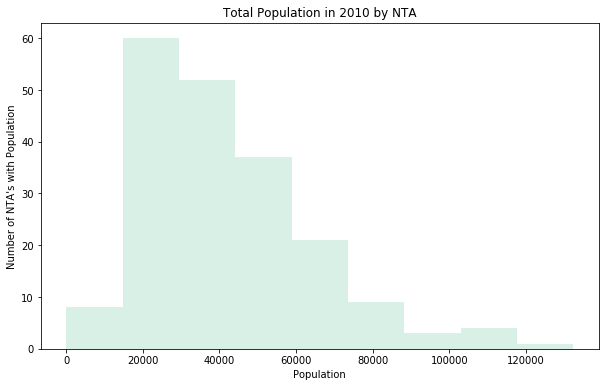

In [200]:
ax = censusNTAshp['Total Population 2010 Number'].plot.hist(bins=9,alpha=0.5, figsize=(10,6), cmap='Pastel2',title='Total Population in 2010 by NTA')
plt.xlabel('Population')
plt.ylabel("Number of NTA's with Population")

In [201]:
shpNTA.head(2)

,boro_code,boro_name,county_fip,ntacode,ntaname,shape_area,shape_leng,geometry
0,3.0,Brooklyn,047,BK88,Borough Park,5.400502e+07,39247.228074,"POLYGON ((-73.97605 40.63128, -73.97717 40.63075, -73.97700 40.62987, -73.97685 40.62909, -73.97670 40.62835, -73.97658 40.62757, -73.97651 40.62729, -73.97645 40.62701, -73.97623 40.62598, -73.97726 40.62585, -73.97720 40.62510, -73.97711 40.62495, -73.97694 40.62405, -73.97683 40.62348, -73.97675 40.62301, -73.97657 40.62199, -73.97695 40.62163, -73.97705 40.62153, -73.97539 40.62077, -73.97682 40.61868, -73.97752 40.61768, -73.97785 40.61729, -73.97563 40.61595, -73.97537 40.61575, -73.97544 40.61611, -73.97548 40.61631, -73.97444 40.61642, -73.97336 40.61654, -73.97290 40.61415, -73.97..."
1,4.0,Queens,081,QN51,Murray Hill,5.248828e+07,33266.904811,"POLYGON ((-73.80379 40.77561, -73.80099 40.77539, -73.79865 40.77520, -73.79853 40.77519, -73.79823 40.77485, -73.79785 40.77442, -73.79772 40.77427, -73.79758 40.77414, -73.79742 40.77401, -73.79742 40.77401, -73.79742 40.77401, -73.79730 40.77393, -73.79724 40.77389, -73.79673 40.77361, -73.79652 40.77350, -73.79572 40.77307, -73.79566 40.77304, -73.79522 40.77267, -73.79507 40.77254, -73.79494 40.77240, -73.79481 40.77226, -73.79416 40.77152, -73.79395 40.77127, -73.79324 40.77047, -73.79318 40.77040, -73.79321 40.77034, -73.79342 40.76860, -73.79361 40.76722, -73.79396 40.76470, -73.79..."


In [202]:
# censusNTAshp.plot(column='Total Population 2010 Number',figsize=(24, 18), cmap = 'ocean', legend=True, legend_kwds={"frameon": False, "title": "Plowing Priority", "loc":"upper left", "title_fontsize":20, "mode":None,"labelspacing":2,"borderpad":2, "prop":{"family":"Corbel", "size":14}});
# plt.title("NYC Department of Sanitation - Snow Priority Designation", fontdict={"family":"Corbel"}, pad=20, fontname="Corbel", size=24);
# plt.ylabel("latitude", fontsize=12);
# plt.xlabel("longitude", fontsize=12);
type(censusNTAshp)

pandas.core.frame.DataFrame

In [203]:
shpNTA.head(2)

,boro_code,boro_name,county_fip,ntacode,ntaname,shape_area,shape_leng,geometry
0,3.0,Brooklyn,047,BK88,Borough Park,5.400502e+07,39247.228074,"POLYGON ((-73.97605 40.63128, -73.97717 40.63075, -73.97700 40.62987, -73.97685 40.62909, -73.97670 40.62835, -73.97658 40.62757, -73.97651 40.62729, -73.97645 40.62701, -73.97623 40.62598, -73.97726 40.62585, -73.97720 40.62510, -73.97711 40.62495, -73.97694 40.62405, -73.97683 40.62348, -73.97675 40.62301, -73.97657 40.62199, -73.97695 40.62163, -73.97705 40.62153, -73.97539 40.62077, -73.97682 40.61868, -73.97752 40.61768, -73.97785 40.61729, -73.97563 40.61595, -73.97537 40.61575, -73.97544 40.61611, -73.97548 40.61631, -73.97444 40.61642, -73.97336 40.61654, -73.97290 40.61415, -73.97..."
1,4.0,Queens,081,QN51,Murray Hill,5.248828e+07,33266.904811,"POLYGON ((-73.80379 40.77561, -73.80099 40.77539, -73.79865 40.77520, -73.79853 40.77519, -73.79823 40.77485, -73.79785 40.77442, -73.79772 40.77427, -73.79758 40.77414, -73.79742 40.77401, -73.79742 40.77401, -73.79742 40.77401, -73.79730 40.77393, -73.79724 40.77389, -73.79673 40.77361, -73.79652 40.77350, -73.79572 40.77307, -73.79566 40.77304, -73.79522 40.77267, -73.79507 40.77254, -73.79494 40.77240, -73.79481 40.77226, -73.79416 40.77152, -73.79395 40.77127, -73.79324 40.77047, -73.79318 40.77040, -73.79321 40.77034, -73.79342 40.76860, -73.79361 40.76722, -73.79396 40.76470, -73.79..."


In [204]:
censusNTA['ntacode'] = censusNTA['Geographic Area - Neighborhood Tabulation Area (NTA)* Code']
censusNTA.head(1)

,Geographic Area - Borough,Geographic Area - 2010 Census FIPS County Code,Geographic Area - Neighborhood Tabulation Area (NTA)* Code,Geographic Area - Neighborhood Tabulation Area (NTA)* Name,Total Population 2000 Number,Total Population 2010 Number,Total Population Change 2000-2010 Number,Total Population Change 2000-2010 Percent,ntacode
0,Bronx,5.0,BX01,Claremont-Bathgate,28149.0,31078.0,2929.0,10.4,BX01


In [205]:
shpNTApop = shpNTA.merge(censusNTA, on='ntacode')
type(shpNTApop)

geopandas.geodataframe.GeoDataFrame

In [206]:
shpNTApop.head(1)

,boro_code,boro_name,county_fip,ntacode,ntaname,shape_area,shape_leng,geometry,Geographic Area - Borough,Geographic Area - 2010 Census FIPS County Code,Geographic Area - Neighborhood Tabulation Area (NTA)* Code,Geographic Area - Neighborhood Tabulation Area (NTA)* Name,Total Population 2000 Number,Total Population 2010 Number,Total Population Change 2000-2010 Number,Total Population Change 2000-2010 Percent
0,3.0,Brooklyn,047,BK88,Borough Park,5.400502e+07,39247.228074,"POLYGON ((-73.97605 40.63128, -73.97717 40.63075, -73.97700 40.62987, -73.97685 40.62909, -73.97670 40.62835, -73.97658 40.62757, -73.97651 40.62729, -73.97645 40.62701, -73.97623 40.62598, -73.97726 40.62585, -73.97720 40.62510, -73.97711 40.62495, -73.97694 40.62405, -73.97683 40.62348, -73.97675 40.62301, -73.97657 40.62199, -73.97695 40.62163, -73.97705 40.62153, -73.97539 40.62077, -73.97682 40.61868, -73.97752 40.61768, -73.97785 40.61729, -73.97563 40.61595, -73.97537 40.61575, -73.97544 40.61611, -73.97548 40.61631, -73.97444 40.61642, -73.97336 40.61654, -73.97290 40.61415, -73.97...",Brooklyn,47.0,BK88,Borough Park,101055.0,106357.0,5302.0,5.2


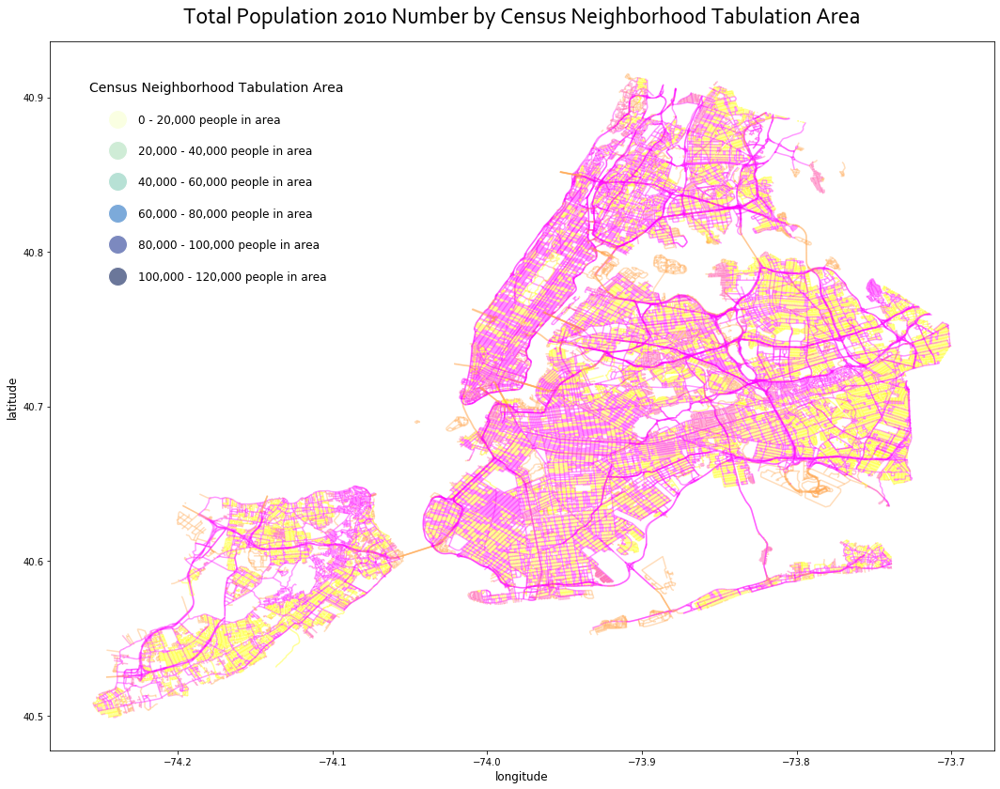

In [207]:
from matplotlib.lines import Line2D

fig, ax = plt.subplots(figsize = (18,16)) 
roads.plot(ax=ax, column='snow_prior', cmap='spring', legend=True, alpha=0.4)
plt.title("Total Population 2010 Number by Census Neighborhood Tabulation Area", fontdict={"family":"Corbel"}, pad=20, fontname="Corbel", size=24);
plt.ylabel("latitude", fontsize=12);
plt.xlabel("longitude", fontsize=12);
line1 = Line2D(range(1), range(1), color="white", marker='o', markerfacecolor="#FAFFE2",markersize=20)
line2 = Line2D(range(1), range(1), color="white", marker='o',markerfacecolor="#CFECD6",markersize=20)
line3 = Line2D(range(1), range(1), color="white", marker='o', markerfacecolor="#B7E1D5",markersize=20)
line4 = Line2D(range(1), range(1), color="white", marker='o',markerfacecolor="#7CAADA",markersize=20)
line5 = Line2D(range(1), range(1), color="white", marker='o', markerfacecolor="#7C89BF",markersize=20)
line6 = Line2D(range(1), range(1), color="white", marker='o',markerfacecolor="#6B779A",markersize=20)
ax.legend((line1,line2,line3,line4,line5,line6),("0 - 20,000 people in area","20,000 - 40,000 people in area","40,000 - 60,000 people in area","60,000 - 80,000 people in area","80,000 - 100,000 people in area","100,000 - 120,000 people in area"),frameon=False, loc='upper left', title = "Census Neighborhood Tabulation Area", title_fontsize=14, labelspacing=1.7, fontsize=12,borderpad=3);
plt.show()

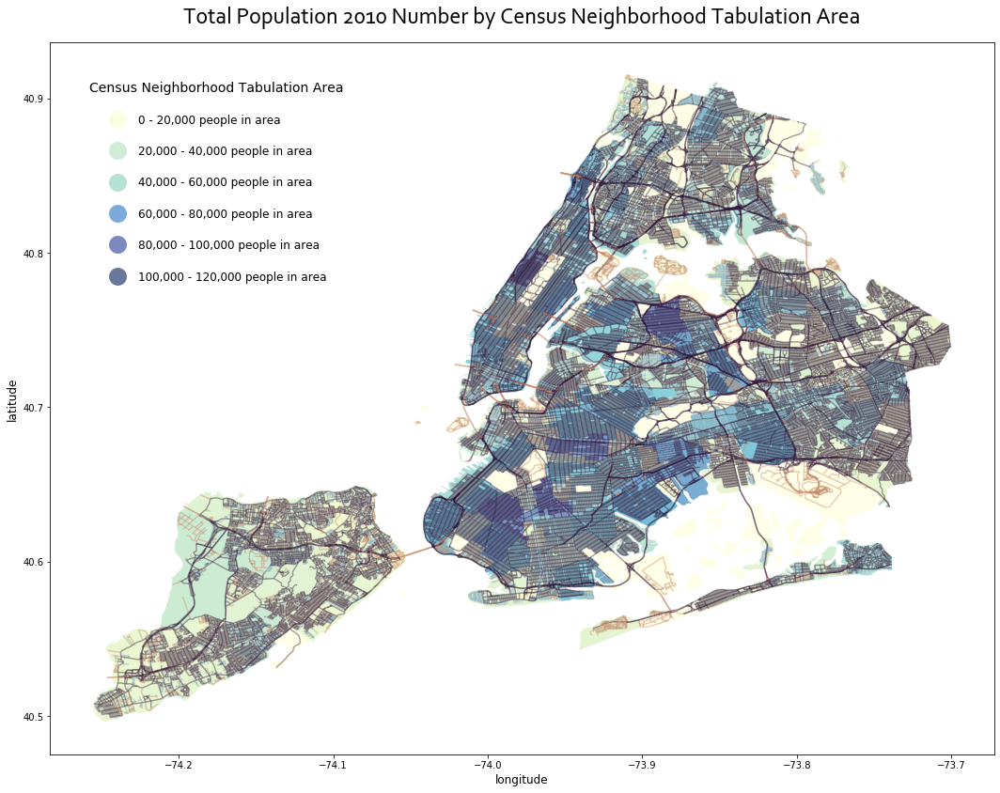

In [208]:
from matplotlib.lines import Line2D

fig, ax = plt.subplots(figsize = (18,16)) 
roads.plot(ax=ax, column='snow_prior', cmap='twilight_shifted', legend=True, alpha=0.4)
shpNTApop.plot(ax=ax, cmap='YlGnBu', column='Total Population 2010 Number', legend=False, alpha=0.6,linewidth=0.2)
plt.title("Total Population 2010 Number by Census Neighborhood Tabulation Area", fontdict={"family":"Corbel"}, pad=20, fontname="Corbel", size=24);
plt.ylabel("latitude", fontsize=12);
plt.xlabel("longitude", fontsize=12);
line1 = Line2D(range(1), range(1), color="white", marker='o', markerfacecolor="#FAFFE2",markersize=20)
line2 = Line2D(range(1), range(1), color="white", marker='o',markerfacecolor="#CFECD6",markersize=20)
line3 = Line2D(range(1), range(1), color="white", marker='o', markerfacecolor="#B7E1D5",markersize=20)
line4 = Line2D(range(1), range(1), color="white", marker='o',markerfacecolor="#7CAADA",markersize=20)
line5 = Line2D(range(1), range(1), color="white", marker='o', markerfacecolor="#7C89BF",markersize=20)
line6 = Line2D(range(1), range(1), color="white", marker='o',markerfacecolor="#6B779A",markersize=20)
ax.legend((line1,line2,line3,line4,line5,line6),("0 - 20,000 people in area","20,000 - 40,000 people in area","40,000 - 60,000 people in area","60,000 - 80,000 people in area","80,000 - 100,000 people in area","100,000 - 120,000 people in area"),frameon=False, loc='upper left', title = "Census Neighborhood Tabulation Area", title_fontsize=14, labelspacing=1.7, fontsize=12,borderpad=3);
plt.savefig('DSNY_Priority_Blue_roads.png',transparent=True)
plt.show()

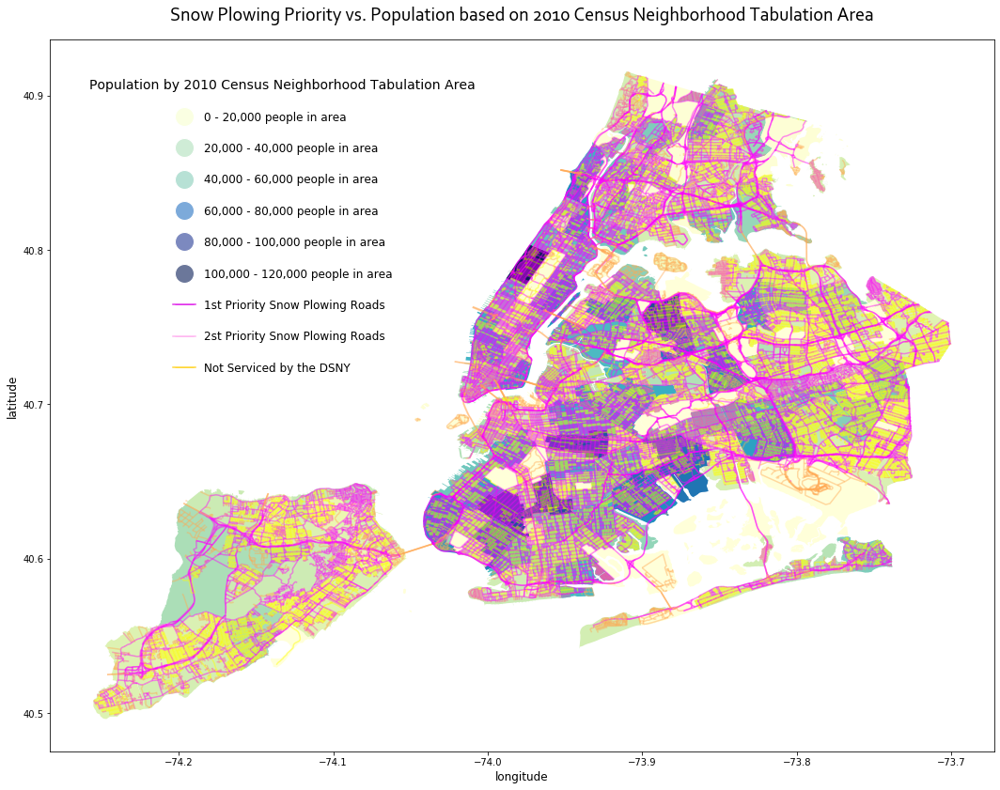

In [219]:
from matplotlib.lines import Line2D

fig, ax = plt.subplots(figsize = (18,16)) 
shpNTApop.plot(ax=ax, cmap='YlGnBu', column='Total Population 2010 Number', legend=False, legend_kwds={"frameon": False, "loc":"upper left", "title_fontsize":20, "mode":None,"labelspacing":2,"borderpad":2, "prop":{"family":"Corbel", "size":14}});
roads.plot(ax=ax, column='snow_prior', cmap='spring', legend=True, alpha=0.45)
plt.title("Snow Plowing Priority vs. Population based on 2010 Census Neighborhood Tabulation Area", fontdict={"family":"Corbel"}, pad=20, fontname="Corbel", size=20);
plt.ylabel("latitude", fontsize=12);
plt.xlabel("longitude", fontsize=12);
line1 = Line2D(range(1), range(1), color="white", marker='o', markerfacecolor="#FAFFE2",markersize=20)
line2 = Line2D(range(1), range(1), color="white", marker='o',markerfacecolor="#CFECD6",markersize=20)
line3 = Line2D(range(1), range(1), color="white", marker='o', markerfacecolor="#B7E1D5",markersize=20)
line4 = Line2D(range(1), range(1), color="white", marker='o',markerfacecolor="#7CAADA",markersize=20)
line5 = Line2D(range(1), range(1), color="white", marker='o', markerfacecolor="#7C89BF",markersize=20)
line6 = Line2D(range(1), range(1), color="white", marker='o',markerfacecolor="#6B779A",markersize=20)
line7 = Line2D(range(1), range(1), color="#e134eb", marker='_',markersize=20)
line8 = Line2D(range(1), range(1), color="#ffb8f1", marker='_',markersize=20)
line9 = Line2D(range(1), range(1), color="#ffd738", marker='_',markersize=20)
ax.legend((line1,line2,line3,line4,line5,line6,line7,line8,line9),("0 - 20,000 people in area","20,000 - 40,000 people in area","40,000 - 60,000 people in area","60,000 - 80,000 people in area","80,000 - 100,000 people in area","100,000 - 120,000 people in area","1st Priority Snow Plowing Roads","2st Priority Snow Plowing Roads","Not Serviced by the DSNY"),frameon=False, loc='upper left', title = "Population by 2010 Census Neighborhood Tabulation Area", title_fontsize=14, labelspacing=1.7, fontsize=12,borderpad=3);
plt.savefig('DSNY_Priority_Pink_roads.png',transparent=True)
plt.show()

In [210]:
import pandas as pd
pd.options.display.max_rows = 999
pd.options.display.max_columns = 999
pd.set_option('max_colwidth', 600)
ACS5_demo= pd.read_excel("C:\\Users\\lilyx\\Snow\\ACS5yrNTA\\demo_2016acs5yr_nta.xlsx")
ACS5_demo.head(2)

,GeoType,GeogName,GeoID,Borough,Pop_1E,Pop_1M,Pop_1C,Pop_1P,Pop_1Z,MaleE,MaleM,MaleC,MaleP,MaleZ,FemE,FemM,FemC,FemP,FemZ,PopU5E,PopU5M,PopU5C,PopU5P,PopU5Z,Pop5t9E,Pop5t9M,Pop5t9C,Pop5t9P,Pop5t9Z,Pop10t14E,Pop10t14M,Pop10t14C,Pop10t14P,Pop10t14Z,Pop15t19E,Pop15t19M,Pop15t19C,Pop15t19P,Pop15t19Z,Pop20t24E,Pop20t24M,Pop20t24C,Pop20t24P,Pop20t24Z,Pop25t29E,Pop25t29M,Pop25t29C,Pop25t29P,Pop25t29Z,Pop30t34E,Pop30t34M,Pop30t34C,Pop30t34P,Pop30t34Z,Pop35t39E,Pop35t39M,Pop35t39C,Pop35t39P,Pop35t39Z,Pop40t44E,Pop40t44M,Pop40t44C,Pop40t44P,Pop40t44Z,Pop45t49E,Pop45t49M,Pop45t49C,Pop45t49P,Pop45t49Z,Pop50t54E,Pop50t54M,Pop50t54C,Pop50t54P,Pop50t54Z,Pop55t59E,Pop55t59M,Pop55t59C,Pop55t59P,Pop55t59Z,Pop60t64E,Pop60t64M,Pop60t64C,Pop60t64P,Pop60t64Z,Pop65t69E,Pop65t69M,Pop65t69C,Pop65t69P,Pop65t69Z,Pop70t74E,Pop70t74M,Pop70t74C,Pop70t74P,Pop70t74Z,Pop75t79E,Pop75t79M,Pop75t79C,Pop75t79P,Pop75t79Z,Pop80t84E,Pop80t84M,Pop80t84C,Pop80t84P,Pop80t84Z,Pop85plE,Pop85plM,Pop85plC,Pop85plP,Pop85plZ,PopU181E,PopU181M,PopU181C,PopU181P,PopU181Z,Pop65pl1E,Pop65pl1M,Pop65pl1C,Pop65pl1P,Pop65pl1Z,MdAgeE,MdAgeM,MdAgeC,MdAgeP,MdAgeZ,PopU18_2E,PopU18_2M,PopU18_2C,PopU18_2P,PopU18_2Z,PopU18ME,PopU18MM,PopU18MC,PopU18MP,PopU18MZ,PopU18FE,PopU18FM,PopU18FC,PopU18FP,PopU18FZ,Pop65pl2E,Pop65pl2M,Pop65pl2C,Pop65pl2P,Pop65pl2Z,Pop65plME,Pop65plMM,Pop65plMC,Pop65plMP,Pop65plMZ,Pop65plFE,Pop65plFM,Pop65plFC,Pop65plFP,Pop65plFZ,Pop_2E,Pop_2M,Pop_2C,Pop_2P,Pop_2Z,Hsp1E,Hsp1M,Hsp1C,Hsp1P,Hsp1Z,NHspE,NHspM,NHspC,NHspP,NHspZ,WtNHE,WtNHM,WtNHC,WtNHP,WtNHZ,BlNHE,BlNHM,BlNHC,BlNHP,BlNHZ,AIANNHE,AIANNHM,AIANNHC,AIANNHP,AIANNHZ,AsnNHE,AsnNHM,AsnNHC,AsnNHP,AsnNHZ,NHPINHE,NHPINHM,NHPINHC,NHPINHP,NHPINHZ,OthNHE,OthNHM,OthNHC,OthNHP,OthNHZ,Rc2plNHE,Rc2plNHM,Rc2plNHC,Rc2plNHP,Rc2plNHZ,Hsp2E,Hsp2M,Hsp2C,Hsp2P,Hsp2Z,HspMeE,HspMeM,HspMeC,HspMeP,HspMeZ,HspPRE,HspPRM,HspPRC,HspPRP,HspPRZ,HspCubE,HspCubM,HspCubC,HspCubP,HspCubZ,HspDomE,HspDomM,HspDomC,HspDomP,HspDomZ,HspCAmE,HspCAmM,HspCAmC,HspCAmP,HspCAmZ,HspCRE,HspCRM,HspCRC,HspCRP,HspCRZ,HspGuatmE,HspGuatmM,HspGuatmC,HspGuatmP,HspGuatmZ,HspHndE,HspHndM,HspHndC,HspHndP,HspHndZ,HspNicE,HspNicM,HspNicC,HspNicP,HspNicZ,HspPanE,HspPanM,HspPanC,HspPanP,HspPanZ,HspSalvE,HspSalvM,HspSalvC,HspSalvP,HspSalvZ,HspOCAmE,HspOCAmM,HspOCAmC,HspOCAmP,HspOCAmZ,HspSAmE,HspSAmM,HspSAmC,HspSAmP,HspSAmZ,HspArgE,HspArgM,HspArgC,HspArgP,HspArgZ,HspBolE,HspBolM,HspBolC,HspBolP,HspBolZ,HspChlE,HspChlM,HspChlC,HspChlP,HspChlZ,HspColE,HspColM,HspColC,HspColP,HspColZ,HspEcE,HspEcM,HspEcC,HspEcP,HspEcZ,HspPrgE,HspPrgM,HspPrgC,HspPrgP,HspPrgZ,HspPeruE,HspPeruM,HspPeruC,HspPeruP,HspPeruZ,HspUrgE,HspUrgM,HspUrgC,HspUrgP,HspUrgZ,HspVnzE,HspVnzM,HspVnzC,HspVnzP,HspVnzZ,HspOSAmE,HspOSAmM,HspOSAmC,HspOSAmP,HspOSAmZ,HspOthE,HspOthM,HspOthC,HspOthP,HspOthZ,HspSpnrdE,HspSpnrdM,HspSpnrdC,HspSpnrdP,HspSpnrdZ,HspSpnshE,HspSpnshM,HspSpnshC,HspSpnshP,HspSpnshZ,HspSpAmE,HspSpAmM,HspSpAmC,HspSpAmP,HspSpAmZ,HspAllOthE,HspAllOthM,HspAllOthC,HspAllOthP,HspAllOthZ,Asn1RcE,Asn1RcM,Asn1RcC,Asn1RcP,Asn1RcZ,AsnEastE,AsnEastM,AsnEastC,AsnEastP,AsnEastZ,AsnChiNoTE,AsnChiNoTM,AsnChiNoTC,AsnChiNoTP,AsnChiNoTZ,AsnJpnE,AsnJpnM,AsnJpnC,AsnJpnP,AsnJpnZ,AsnKorE,AsnKorM,AsnKorC,AsnKorP,AsnKorZ,AsnMgolE,AsnMgolM,AsnMgolC,AsnMgolP,AsnMgolZ,AsnOkinwE,AsnOkinwM,AsnOkinwC,AsnOkinwP,AsnOkinwZ,AsnTwnE,AsnTwnM,AsnTwnC,AsnTwnP,AsnTwnZ,AsnSouthE,AsnSouthM,AsnSouthC,AsnSouthP,AsnSouthZ,AsnIndE,AsnIndM,AsnIndC,AsnIndP,AsnIndZ,AsnBngE,AsnBngM,AsnBngC,AsnBngP,AsnBngZ,AsnBhutnE,AsnBhutnM,AsnBhutnC,AsnBhutnP,AsnBhutnZ,AsnNepalE,AsnNepalM,AsnNepalC,AsnNepalP,AsnNepalZ,AsnPakE,AsnPakM,AsnPakC,AsnPakP,AsnPakZ,AsnSriLE,AsnSriLM,AsnSriLC,AsnSriLP,AsnSriLZ,AsnSEastE,AsnSEastM,AsnSEastC,AsnSEastP,AsnSEastZ,AsnBurmE,AsnBurmM,AsnBurmC,AsnBurmP,AsnBurmZ,AsnCmbE,AsnCmbM,AsnCmbC,AsnCmbP,AsnCmbZ,AsnFlpE,AsnFlpM,AsnFlpC,AsnFlpP,AsnFlpZ,AsnHmngE,AsnHmngM,AsnHmngC,AsnHmngP,AsnHmngZ,AsnIndnsnE,AsnIndnsnM,AsnIndnsnC,AsnIndnsnP,AsnIndnsnZ,AsnLaoE,AsnLaoM,AsnLaoC,AsnLaoP,AsnLaoZ,AsnMalsnE,AsnMalsnM,AsnMalsnC,AsnMalsnP,AsnMalsnZ,Asn

In [211]:
ACS5_econ= pd.read_excel("C:\\Users\\lilyx\\Snow\\ACS5yrNTA\\econ_2016acs5yr_nta.xlsx")
ACS5_econ.head(2)

,GeoType,GeogName,GeoID,Borough,Pop16plE,Pop16plM,Pop16plC,Pop16plP,Pop16plZ,LFE,LFM,LFC,LFP,LFZ,CvLF1E,CvLF1M,CvLF1C,CvLF1P,CvLF1Z,CvEm16pl1E,CvEm16pl1M,CvEm16pl1C,CvEm16pl1P,CvEm16pl1Z,CvLFUEm1E,CvLFUEm1M,CvLFUEm1C,CvLFUEm1P,CvLFUEm1Z,LFArmdFE,LFArmdFM,LFArmdFC,LFArmdFP,LFArmdFZ,NLF1E,NLF1M,NLF1C,NLF1P,NLF1Z,CvLF2E,CvLF2M,CvLF2C,CvLF2P,CvLF2Z,CvLFUEm2E,CvLFUEm2M,CvLFUEm2C,CvLFUEm2P,CvLFUEm2Z,F16plE,F16plM,F16plC,F16plP,F16plZ,F16plLFE,F16plLFM,F16plLFC,F16plLFP,F16plLFZ,F16plCvLFE,F16plCvLFM,F16plCvLFC,F16plCvLFP,F16plCvLFZ,F16plCLFEE,F16plCLFEM,F16plCLFEC,F16plCLFEP,F16plCLFEZ,OChU6E,OChU6M,OChU6C,OChU6P,OChU6Z,OChU6PLFE,OChU6PLFM,OChU6PLFC,OChU6PLFP,OChU6PLFZ,OCh6t17E,OCh6t17M,OCh6t17C,OCh6t17P,OCh6t17Z,OC6t17PLFE,OC6t17PLFM,OC6t17PLFC,OC6t17PLFP,OC6t17PLFZ,Wrkr16plE,Wrkr16plM,Wrkr16plC,Wrkr16plP,Wrkr16plZ,CW_DrvAlnE,CW_DrvAlnM,CW_DrvAlnC,CW_DrvAlnP,CW_DrvAlnZ,CW_CrpldE,CW_CrpldM,CW_CrpldC,CW_CrpldP,CW_CrpldZ,CW_PbTrnsE,CW_PbTrnsM,CW_PbTrnsC,CW_PbTrnsP,CW_PbTrnsZ,CW_WlkdE,CW_WlkdM,CW_WlkdC,CW_WlkdP,CW_WlkdZ,CW_OthE,CW_OthM,CW_OthC,CW_OthP,CW_OthZ,CW_WrkdHmE,CW_WrkdHmM,CW_WrkdHmC,CW_WrkdHmP,CW_WrkdHmZ,MnTrvTmE,MnTrvTmM,MnTrvTmC,MnTrvTmP,MnTrvTmZ,CvEm16pl2E,CvEm16pl2M,CvEm16pl2C,CvEm16pl2P,CvEm16pl2Z,MgBSciArtE,MgBSciArtM,MgBSciArtC,MgBSciArtP,MgBSciArtZ,SrvcE,SrvcM,SrvcC,SrvcP,SrvcZ,SalesOffE,SalesOffM,SalesOffC,SalesOffP,SalesOffZ,NRCnstMntE,NRCnstMntM,NRCnstMntC,NRCnstMntP,NRCnstMntZ,PrdTrnsMME,PrdTrnsMMM,PrdTrnsMMC,PrdTrnsMMP,PrdTrnsMMZ,CvEm16pl3E,CvEm16pl3M,CvEm16pl3C,CvEm16pl3P,CvEm16pl3Z,AgFFHME,AgFFHMM,AgFFHMC,AgFFHMP,AgFFHMZ,ConstctnE,ConstctnM,ConstctnC,ConstctnP,ConstctnZ,MnfctrngE,MnfctrngM,MnfctrngC,MnfctrngP,MnfctrngZ,WhlsaleE,WhlsaleM,WhlsaleC,WhlsaleP,WhlsaleZ,RetailE,RetailM,RetailC,RetailP,RetailZ,TrWHUtE,TrWHUtM,TrWHUtC,TrWHUtP,TrWHUtZ,InfoE,InfoM,InfoC,InfoP,InfoZ,FIREE,FIREM,FIREC,FIREP,FIREZ,PrfSMgAWME,PrfSMgAWMM,PrfSMgAWMC,PrfSMgAWMP,PrfSMgAWMZ,EdHlthCSAE,EdHlthCSAM,EdHlthCSAC,EdHlthCSAP,EdHlthCSAZ,ArtEnRAFSE,ArtEnRAFSM,ArtEnRAFSC,ArtEnRAFSP,ArtEnRAFSZ,OthnotPAE,OthnotPAM,OthnotPAC,OthnotPAP,OthnotPAZ,PubAdminE,PubAdminM,PubAdminC,PubAdminP,PubAdminZ,CvEm16pl4E,CvEm16pl4M,CvEm16pl4C,CvEm16pl4P,CvEm16pl4Z,PrvWSWrkrE,PrvWSWrkrM,PrvWSWrkrC,PrvWSWrkrP,PrvWSWrkrZ,GvtWrkrE,GvtWrkrM,GvtWrkrC,GvtWrkrP,GvtWrkrZ,SlfEmNIncE,SlfEmNIncM,SlfEmNIncC,SlfEmNIncP,SlfEmNIncZ,UpdFmWrkrE,UpdFmWrkrM,UpdFmWrkrC,UpdFmWrkrP,UpdFmWrkrZ,HH2E,HH2M,HH2C,HH2P,HH2Z,HHIU10E,HHIU10M,HHIU10C,HHIU10P,HHIU10Z,HHI10t14E,HHI10t14M,HHI10t14C,HHI10t14P,HHI10t14Z,HHI15t24E,HHI15t24M,HHI15t24C,HHI15t24P,HHI15t24Z,HHI25t34E,HHI25t34M,HHI25t34C,HHI25t34P,HHI25t34Z,HHI35t49E,HHI35t49M,HHI35t49C,HHI35t49P,HHI35t49Z,HHI50t74E,HHI50t74M,HHI50t74C,HHI50t74P,HHI50t74Z,HHI75t99E,HHI75t99M,HHI75t99C,HHI75t99P,HHI75t99Z,HI100t149E,HI100t149M,HI100t149C,HI100t149P,HI100t149Z,HI150t199E,HI150t199M,HI150t199C,HI150t199P,HI150t199Z,HHI200plE,HHI200plM,HHI200plC,HHI200plP,HHI200plZ,MdHHIncE,MdHHIncM,MdHHIncC,MdHHIncP,MdHHIncZ,MnHHIncE,MnHHIncM,MnHHIncC,MnHHIncP,MnHHIncZ,Inc_SoSecE,Inc_SoSecM,Inc_SoSecC,Inc_SoSecP,Inc_SoSecZ,Inc_RtrmtE,Inc_RtrmtM,Inc_RtrmtC,Inc_RtrmtP,Inc_RtrmtZ,Inc_SpSecE,Inc_SpSecM,Inc_SpSecC,Inc_SpSecP,Inc_SpSecZ,Inc_CPbAE,Inc_CPbAM,Inc_CPbAC,Inc_CPbAP,Inc_CPbAZ,Inc_SNAPE,Inc_SNAPM,Inc_SNAPC,Inc_SNAPP,Inc_SNAPZ,Fam2E,Fam2M,Fam2C,Fam2P,Fam2Z,FamIU10E,FamIU10M,FamIU10C,FamIU10P,FamIU10Z,FamI10t14E,FamI10t14M,FamI10t14C,FamI10t14P,FamI10t14Z,FamI15t24E,FamI15t24M,FamI15t24C,FamI15t24P,FamI15t24Z,FamI25t34E,FamI25t34M,FamI25t34C,FamI25t34P,FamI25t34Z,FamI35t49E,FamI35t49M,FamI35t49C,FamI35t49P,FamI35t49Z,FamI50t74E,FamI50t74M,FamI50t74C,FamI50t74P,FamI50t74Z,FamI75t99E,FamI75t99M,FamI75t99C,FamI75t99P,FamI75t99Z,FI100t149E,FI100t149M,FI100t149C,FI100t149P,FI100t149Z,FI150t199E,FI150t199M,FI150t199C,FI150t199P,FI150t199Z,FamI200plE,FamI200plM,FamI200plC,FamI200plP,FamI200plZ,MdFamIncE,MdFamIncM,MdFamIncC,MdFamIncP,MdFamIncZ,Nfam2E,Nfam2M,Nfam2C,Nfam2P,Nfam2Z,MdNFIncE,MdNFIncM,MdNFIncC,MdNFIncP,MdNFIncZ,PerCapIncE,PerCapIncM,PerCapIncC,PerCapIncP

In [145]:
ACS5_hous= pd.read_excel("C:\\Users\\lilyx\\Snow\\ACS5yrNTA\\hous_2016acs5yr_nta.xlsx")
ACS5_hous.head(2)

,GeoType,GeogName,GeoID,Borough,HU1E,HU1M,HU1C,HU1P,HU1Z,OcHU1E,OcHU1M,OcHU1C,OcHU1P,OcHU1Z,VacHUE,VacHUM,VacHUC,VacHUP,VacHUZ,HOVacRtE,HOVacRtM,HOVacRtC,HOVacRtP,HOVacRtZ,RntVacRtE,RntVacRtM,RntVacRtC,RntVacRtP,RntVacRtZ,HU2E,HU2M,HU2C,HU2P,HU2Z,HU1uDE,HU1uDM,HU1uDC,HU1uDP,HU1uDZ,HU1uAE,HU1uAM,HU1uAC,HU1uAP,HU1uAZ,HU2uE,HU2uM,HU2uC,HU2uP,HU2uZ,HU3t4uE,HU3t4uM,HU3t4uC,HU3t4uP,HU3t4uZ,HU5t9uE,HU5t9uM,HU5t9uC,HU5t9uP,HU5t9uZ,HU10t19uE,HU10t19uM,HU10t19uC,HU10t19uP,HU10t19uZ,HU20pluE,HU20pluM,HU20pluC,HU20pluP,HU20pluZ,MobHmE,MobHmM,MobHmC,MobHmP,MobHmZ,BtRVVEtcE,BtRVVEtcM,BtRVVEtcC,BtRVVEtcP,BtRVVEtcZ,HU3E,HU3M,HU3C,HU3P,HU3Z,Blt10LtrE,Blt10LtrM,Blt10LtrC,Blt10LtrP,Blt10LtrZ,Blt00t09E,Blt00t09M,Blt00t09C,Blt00t09P,Blt00t09Z,Blt90t99E,Blt90t99M,Blt90t99C,Blt90t99P,Blt90t99Z,Blt80t89E,Blt80t89M,Blt80t89C,Blt80t89P,Blt80t89Z,Blt70t79E,Blt70t79M,Blt70t79C,Blt70t79P,Blt70t79Z,Blt60t69E,Blt60t69M,Blt60t69C,Blt60t69P,Blt60t69Z,Blt50t59E,Blt50t59M,Blt50t59C,Blt50t59P,Blt50t59Z,Blt40t49E,Blt40t49M,Blt40t49C,Blt40t49P,Blt40t49Z,BltBf39E,BltBf39M,BltBf39C,BltBf39P,BltBf39Z,HU4E,HU4M,HU4C,HU4P,HU4Z,Rms1E,Rms1M,Rms1C,Rms1P,Rms1Z,Rms2E,Rms2M,Rms2C,Rms2P,Rms2Z,Rms3E,Rms3M,Rms3C,Rms3P,Rms3Z,Rms4E,Rms4M,Rms4C,Rms4P,Rms4Z,Rms5E,Rms5M,Rms5C,Rms5P,Rms5Z,Rms6E,Rms6M,Rms6C,Rms6P,Rms6Z,Rms7E,Rms7M,Rms7C,Rms7P,Rms7Z,Rms8E,Rms8M,Rms8C,Rms8P,Rms8Z,Rms9plE,Rms9plM,Rms9plC,Rms9plP,Rms9plZ,MdRmsE,MdRmsM,MdRmsC,MdRmsP,MdRmsZ,OcHU2E,OcHU2M,OcHU2C,OcHU2P,OcHU2Z,OOcHU1E,OOcHU1M,OOcHU1C,OOcHU1P,OOcHU1Z,ROcHU1E,ROcHU1M,ROcHUC,ROcHUP,ROcHUZ,AvgHHSOOcE,AvgHHSOOcM,AvgHHSOOcC,AvgHHSOOcP,AvgHHSOOcZ,AvgHHSROcE,AvgHHSROcM,AvgHHSROcC,AvgHHSROcP,AvgHHSROcZ,OcHU3E,OcHU3M,OcHU3C,OcHU3P,OcHU3Z,Mv10LtrE,Mv10LtrM,Mv10LtrC,Mv10LtrP,Mv10LtrZ,Mv00t09E,Mv00t09M,Mv00t09C,Mv00t09P,Mv00t09Z,Mv90t99E,Mv90t99M,Mv90t99C,Mv90t99P,Mv90t99Z,Mv80t89E,Mv80t89M,Mv80t89C,Mv80t89P,Mv80t89Z,MvBf79E,MvBf79M,MvBf79C,MvBf79P,MvBf79Z,OcHU4E,OcHU4M,OcHU4C,OcHU4P,OcHU4Z,NoVhclAvE,NoVhclAvM,NoVhclAvC,NoVhclAvP,NoVhclAvZ,Vhcl1AvE,Vhcl1AvM,Vhcl1AvC,Vhcl1AvP,Vhcl1AvZ,Vhcl2AvE,Vhcl2AvM,Vhcl2AvC,Vhcl2AvP,Vhcl2AvZ,Vhcl3plAvE,Vhcl3plAvM,Vhcl3plAvC,Vhcl3plAvP,Vhcl3plAvZ,OcHU5E,OcHU5M,OcHU5C,OcHU5P,OcHU5Z,OcPR0t1E,OcPR0t1M,OcPR0t1C,OcPR0t1P,OcPR0t1Z,OcPR1plE,OcPR1plM,OcPR1plC,OcPR1plP,OcPR1plZ,OcPR1p5plE,OcPR1p5plM,OcPR1p5plC,OcPR1p5plP,OcPR1p5plZ,OOcHU2E,OOcHU2M,OOcHU2C,OOcHU2P,OOcHU2Z,VlU50E,VlU50M,VlU50C,VlU50P,VlU50Z,Vl50t99E,Vl50t99M,Vl50t99C,Vl50t99P,Vl50t99Z,Vl100t149E,Vl100t149M,Vl100t149C,Vl100t149P,Vl100t149Z,Vl150t199E,Vl150t199M,Vl150t199C,Vl150t199P,Vl150t199Z,Vl200t299E,Vl200t299M,Vl200t299C,Vl200t299P,Vl200t299Z,Vl300t499E,Vl300t499M,Vl300t499C,Vl300t499P,Vl300t499Z,Vl500t999E,Vl500t999M,Vl500t999C,Vl500t999P,Vl500t999Z,Vl1milplE,Vl1milplM,Vl1milplC,Vl1milplP,Vl1milplZ,MdVlE,MdVlM,MdVlC,MdVlP,MdVlZ,OOcHU3E,OOcHU3M,OOcHU3C,OOcHU3P,OOcHU3Z,HUwMrtgE,HUwMrtgM,HUwMrtgC,HUwMrtgP,HUwMrtgZ,HUnoMrtg1E,HUnoMrtg1M,HUnoMrtg1C,HUnoMrtg1P,HUnoMrtg1Z,HUwMrtgExE,HUwMrtgExM,HUwMrtgExC,HUwMrtgExP,HUwMrtgExZ,SMPU20E,SMPU20M,SMPU20C,SMPU20P,SMPU20Z,SMP20t24E,SMP20t24M,SMP20t24C,SMP20t24P,SMP20t24Z,SMP25t29E,SMP25t29M,SMP25t29C,SMP25t29P,SMP25t29Z,SMP30t34E,SMP30t34M,SMP30t34C,SMP30t34P,SMP30t34Z,SMP35plE,SMP35plM,SMP35plC,SMP35plP,SMP35plZ,SMPNtCE,SMPNtCM,SMPNtCC,SMPNtCP,SMPNtCZ,HUnoMrtg2E,HUnoMrtg2M,HUnoMrtg2C,HUnoMrtg2P,HUnoMrtg2Z,NMSMPU10E,NMSMPU10M,NMSMPU10C,NMSMPU10P,NMSMPU10Z,NMSMP1014E,NMSMP1014M,NMSMP1014C,NMSMP1014P,NMSMP1014Z,NMSMP1519E,NMSMP1519M,NMSMP1519C,NMSMP1519P,NMSMP1519Z,NMSMP2024E,NMSMP2024M,NMSMP2024C,NMSMP2024P,NMSMP2024Z,NMSMP2529E,NMSMP2529M,NMSMP2529C,NMSMP2529P,NMSMP2529Z,NMSMP3034E,NMSMP3034M,NMSMP3034C,NMSMP3034P,NMSMP3034Z,NMSMP35plE,NMSMP35plM,NMSMP35plC,NMSMP35plP,NMSMP35plZ,NMSMPNtCE,NMSMPNtCM,NMSMPNtCC,NMSMPNtCP,NMSMPNtCZ,OcHUPRnt1E,OcHUPRnt1M,OcHUPRnt1C,OcHUPRnt1P,OcHUPRnt1Z,GRU500E,GRU500M,GRU500C,GRU500P,GRU500Z,GR500t999E,GR500t999M,GR500t999C,GR500t999P,GR500t999Z,GR1kt14kE,GR1kt14kM,GR1kt14kC,GR1kt14kP,GR1kt14kZ,GR15kt19kE,GR15kt19kM,GR15kt19kC,GR15kt19kP,GR15kt19kZ,GR20kt24kE,

In [146]:
ACS5_soc= pd.read_excel("C:\\Users\\lilyx\\Snow\\ACS5yrNTA\\soc_2016acs5yr_nta.xlsx")
ACS5_soc.head(2)

,GeoType,GeogName,GeoID,Borough,HH1E,HH1M,HH1C,HH1P,HH1Z,Fam1E,Fam1M,Fam1C,Fam1P,Fam1Z,FamChU18E,FamChU18M,FamChU18C,FamChU18P,FamChU18Z,MrdFamE,MrdFamM,MrdFamC,MrdFamP,MrdFamZ,MrdChU18E,MrdChU18M,MrdChU18C,MrdChU18P,MrdChU18Z,MHnWE,MHnWM,MHnWC,MHnWP,MHnWZ,MHnWChU18E,MHnWChU18M,MHnWChU18C,MHnWChU18P,MHnWChU18Z,FHnHE,FHnHM,FHnHC,FHnHP,FHnHZ,FHnHChU18E,FHnHChU18M,FHnHChU18C,FHnHChU18P,FHnHChU18Z,NFam1E,NFam1M,NFam1C,NFam1P,NFam1Z,NFamAE,NFamAM,NFamAC,NFamAP,NFamAZ,NFamA65plE,NFamA65plM,NFamA65plC,NFamA65plP,NFamA65plZ,HH1plU18E,HH1plU18M,HH1plU18C,HH1plU18P,HH1plU18Z,HH1pl65plE,HH1pl65plM,HH1pl65plC,HH1pl65plP,HH1pl65plZ,AvgHHSzE,AvgHHSzM,AvgHHSzC,AvgHHSzP,AvgHHSzZ,AvgFmSzE,AvgFmSzM,AvgFmSzC,AvgFmSzP,AvgFmSzZ,HHPopE,HHPopM,HHPopC,HHPopP,HHPopZ,RshpHHldrE,RshpHHldrM,RshpHHldrC,RshpHHldrP,RshpHHldrZ,Rshp_SpE,Rshp_SpM,Rshp_SpC,Rshp_SpP,Rshp_SpZ,Rshp_ChE,Rshp_ChM,Rshp_ChC,Rshp_ChP,Rshp_ChZ,Rshp_OthRE,Rshp_OthRM,Rshp_OthRC,Rshp_OthRP,Rshp_OthRZ,Rshp_NRE,Rshp_NRM,Rshp_NRC,Rshp_NRP,Rshp_NRZ,Rshp_NRUPE,Rshp_NRUPM,Rshp_NRUPC,Rshp_NRUPP,Rshp_NRUPZ,Rshp_SSUPE,Rshp_SSUPM,Rshp_SSUPC,Rshp_SSUPP,Rshp_SSUPZ,MS_M15plE,MS_M15plM,MS_M15plC,MS_M15plP,MS_M15plZ,MS_MNvMrdE,MS_MNvMrdM,MS_MNvMrdC,MS_MNvMrdP,MS_MNvMrdZ,MS_MMrdSpE,MS_MMrdSpM,MS_MMrdSpC,MS_MMrdSpP,MS_MMrdSpZ,MS_MSpE,MS_MSpM,MS_MSpC,MS_MSpP,MS_MSpZ,MS_MWdE,MS_MWdM,MS_MWdC,MS_MWdP,MS_MWdZ,MS_MDvcdE,MS_MDvcdM,MS_MDvcdC,MS_MDvcdP,MS_MDvcdZ,MS_F15plE,MS_F15plM,MS_F15plC,MS_F15plP,MS_F15plZ,MS_FNvMrdE,MS_FNvMrdM,MS_FNvMrdC,MS_FNvMrdP,MS_FNvMrdZ,MS_FMrdSpE,MS_FMrdSpM,MS_FMrdSpC,MS_FMrdSpP,MS_FMrdSpZ,MS_FSpE,MS_FSpM,MS_FSpC,MS_FSpP,MS_FSpZ,MS_FWdE,MS_FWdM,MS_FWdC,MS_FWdP,MS_FWdZ,MS_FDvcdE,MS_FDvcdM,MS_FDvcdC,MS_FDvcdP,MS_FDvcdZ,GpLGcU18E,GpLGcU18M,GpLGcU18C,GpLGcU18P,GpLGcU18Z,GpRGcU18E,GpRGcU18M,GpRGcU18C,GpRGcU18P,GpRGcU18Z,Pop3plEnE,Pop3plEnM,Pop3plEnC,Pop3plEnP,Pop3plEnZ,SE_NScPScE,SE_NScPScM,SE_NScPScC,SE_NScPScP,SE_NScPScZ,SE_KndgtnE,SE_KndgtnM,SE_KndgtnC,SE_KndgtnP,SE_KndgtnZ,SE_G1t8E,SE_G1t8M,SE_G1t8C,SE_G1t8P,SE_G1t8Z,SE_G9t12E,SE_G9t12M,SE_G9t12C,SE_G9t12P,SE_G9t12Z,SE_ClgGScE,SE_ClgGScM,SE_ClgGScC,SE_ClgGScP,SE_ClgGScZ,EA_P25plE,EA_P25plM,EA_P25plC,EA_P25plP,EA_P25plZ,EA_LT9GE,EA_LT9GM,EA_LT9GC,EA_LT9GP,EA_LT9GZ,EA_9t12NDE,EA_9t12NDM,EA_9t12NDC,EA_9t12NDP,EA_9t12NDZ,EA_HScGrdE,EA_HScGrdM,EA_HScGrdC,EA_HScGrdP,EA_HScGrdZ,EA_SClgNDE,EA_SClgNDM,EA_SClgNDC,EA_SClgNDP,EA_SClgNDZ,EA_AscDE,EA_AscDM,EA_AscDC,EA_AscDP,EA_AscDZ,EA_BchDE,EA_BchDM,EA_BchDC,EA_BchDP,EA_BchDZ,EA_GrdPfDE,EA_GrdPfDM,EA_GrdPfDC,EA_GrdPfDP,EA_GrdPfDZ,EA_LTHSGrE,EA_LTHSGrM,EA_LTHSGrC,EA_LTHSGrP,EA_LTHSGrZ,EA_BchDHE,EA_BchDHM,EA_BchDHC,EA_BchDHP,EA_BchDHZ,CvPop18plE,CvPop18plM,CvPop18plC,CvPop18plP,CvPop18plZ,CvVet18plE,CvVet18plM,CvVet18plC,CvVet18plP,CvVet18plZ,CvNIPop1E,CvNIPop1M,CvNIPop1C,CvNIPop1P,CvNIPop1Z,CvNIDE,CvNIDM,CvNIDC,CvNIDP,CvNIDZ,CvNID_HrgE,CvNID_HrgM,CvNID_HrgC,CvNID_HrgP,CvNID_HrgZ,CvNID_VsnE,CvNID_VsnM,CvNID_VsnC,CvNID_VsnP,CvNID_VsnZ,CvNID_CogE,CvNID_CogM,CvNID_CogC,CvNID_CogP,CvNID_CogZ,CvNID_AmbE,CvNID_AmbM,CvNID_AmbC,CvNID_AmbP,CvNID_AmbZ,CvNID_SCrE,CvNID_SCrM,CvNID_SCrC,CvNID_SCrP,CvNID_SCrZ,CvNID_ILDE,CvNID_ILDM,CvNID_ILDC,CvNID_ILDP,CvNID_ILDZ,CvNIU18_1E,CvNIU18_1M,CvNIU18_1C,CvNIU18_1P,CvNIU18_1Z,CvNIU18DE,CvNIU18DM,CvNIU18DC,CvNIU18DP,CvNIU18DZ,CU18DHrgE,CU18DHrgM,CU18DHrgC,CU18DHrgP,CU18DHrgZ,CU18DVsnE,CU18DVsnM,CU18DVsnC,CU18DVsnP,CU18DVsnZ,CU18DCogE,CU18DCogM,CU18DCogC,CU18DCogP,CU18DCogZ,CU18DAmbE,CU18DAmbM,CU18DAmbC,CU18DAmbP,CU18DAmbZ,CU18DSCrE,CU18DSCrM,CU18DSCrC,CU18DSCrP,CU18DSCrZ,CNI1864_1E,CNI1864_1M,CNI1864_1C,CNI1864_1P,CNI1864_1Z,CNI18t64DE,CNI18t64DM,CNI18t64DC,CNI18t64DP,CNI18t64DZ,C1864DHrgE,C1864DHrgM,C1864DHrgC,C1864DHrgP,C1864DHrgZ,C1864DVsnE,C1864DVsnM,C1864DVsnC,C1864DVsnP,C1864DVsnZ,C1864DCogE,C1864DCogM,C1864DCogC,C1864DCogP,C1864DCogZ,C1864DAmbE,C1864DAmbM,C1864DAmbC,C1864DAmbP,C1864DAmbZ,C1864DSCrE,C1864DSCrM,C1864DSCrC,C1864DSCrP,C1864DSCrZ,C1864DILDE,C1864DILDM,C1864DILDC,C1864DILDP,C1864DILDZ,CvNI65plE,CvNI65plM,CvNI65plC,CvNI65plP,CvNI65plZ,CvNI65plDE,CvNI65plDM,C

In [153]:
e = pd.read_csv("C:\\Users\\lilyx\\Elections\\00050100000Citywide ELECTIONS Citywide EDLevel.csv")
e.head()

,AD,ED,County,EDAD Status,Event,Party/Independent Body,Office/Position Title,District Key,VoteFor,Unit Name,Tally,65,001,New York,IN-PLAY,General Election 2019 - 11/05/2019,Unnamed: 16,ELECTIONS,NYC,1,Public Counter,175
0,AD,ED,County,EDAD Status,Event,Party/Independent Body,Office/Position Title,District Key,VoteFor,Unit Name,Tally,65,1,New York,IN-PLAY,General Election 2019 - 11/05/2019,NaN,ELECTIONS,NYC,1,Manually Counted Emergency,0
1,AD,ED,County,EDAD Status,Event,Party/Independent Body,Office/Position Title,District Key,VoteFor,Unit Name,Tally,65,1,New York,IN-PLAY,General Election 2019 - 11/05/2019,NaN,ELECTIONS,NYC,1,Absentee / Military,2
2,AD,ED,County,EDAD Status,Event,Party/Independent Body,Office/Position Title,District Key,VoteFor,Unit Name,Tally,65,1,New York,IN-PLAY,General Election 2019 - 11/05/2019,NaN,ELECTIONS,NYC,1,Affidavit,3
3,AD,ED,County,EDAD Status,Event,Party/Independent Body,Office/Position Title,District Key,VoteFor,Unit Name,Tally,65,1,New York,IN-PLAY,General Election 2019 - 11/05/2019,NaN,ELECTIONS,NYC,1,Yes,143
4,AD,ED,County,EDAD Status,Event,Party/Independent Body,Office/Position Title,District Key,VoteFor,Unit Name,Tally,65,1,New York,IN-PLAY,General Election 2019 - 11/05/2019,NaN,ELECTIONS,NYC,1,No,33


In [154]:
ec = pd.read_csv("C:\\Users\\lilyx\\Elections\\00150100000New York ELECTIONS Citywide EDLevel.csv")
ec.head()

,AD,ED,County,EDAD Status,Event,Party/Independent Body,Office/Position Title,District Key,VoteFor,Unit Name,Tally,65,001,New York,IN-PLAY,General Election 2019 - 11/05/2019,Unnamed: 16,ELECTIONS,NYC,1,Public Counter,175
0,AD,ED,County,EDAD Status,Event,Party/Independent Body,Office/Position Title,District Key,VoteFor,Unit Name,Tally,65,1,New York,IN-PLAY,General Election 2019 - 11/05/2019,NaN,ELECTIONS,NYC,1,Manually Counted Emergency,0
1,AD,ED,County,EDAD Status,Event,Party/Independent Body,Office/Position Title,District Key,VoteFor,Unit Name,Tally,65,1,New York,IN-PLAY,General Election 2019 - 11/05/2019,NaN,ELECTIONS,NYC,1,Absentee / Military,2
2,AD,ED,County,EDAD Status,Event,Party/Independent Body,Office/Position Title,District Key,VoteFor,Unit Name,Tally,65,1,New York,IN-PLAY,General Election 2019 - 11/05/2019,NaN,ELECTIONS,NYC,1,Affidavit,3
3,AD,ED,County,EDAD Status,Event,Party/Independent Body,Office/Position Title,District Key,VoteFor,Unit Name,Tally,65,1,New York,IN-PLAY,General Election 2019 - 11/05/2019,NaN,ELECTIONS,NYC,1,Yes,143
4,AD,ED,County,EDAD Status,Event,Party/Independent Body,Office/Position Title,District Key,VoteFor,Unit Name,Tally,65,1,New York,IN-PLAY,General Election 2019 - 11/05/2019,NaN,ELECTIONS,NYC,1,No,33


In [157]:
ec.describe()

,65,001,Unnamed: 16,1,175
count,6661.000000,6661.000000,0.0,6661.0,6661.000000
mean,70.489566,53.641645,NaN,1.0,55.662213
std,3.422820,31.141524,NaN,0.0,103.891802
min,65.000000,1.000000,NaN,1.0,0.000000
25%,68.000000,27.000000,NaN,1.0,0.000000
50%,70.000000,53.000000,NaN,1.0,1.000000
75%,73.000000,80.000000,NaN,1.0,53.000000
max,76.000000,115.000000,NaN,1.0,779.000000


In [156]:
e.shape

(30557, 22)

In [163]:
electionDistricts = "C:\\Users\\lilyx\\Elections\\Election Districts\\geo_export_07079e7e-5389-4b0c-bb40-257f01dc1127.shp"
electionDistricts = gpd.read_file(roads_path, encoding='utf-8')
electionDistricts.head(1)

,elect_dist,shape_area,shape_leng,geometry
0,23002.0,5.646613e+06,13511.950449,"POLYGON ((-73.91313 40.56464, -73.91292 40.56444, -73.91304 40.56438, -73.91441 40.56375, -73.91485 40.56262, -73.91500 40.56225, -73.91514 40.56191, -73.91521 40.56170, -73.91535 40.56139, -73.91454 40.56137, -73.91421 40.56141, -73.91315 40.56136, -73.91322 40.56083, -73.91298 40.56082, -73.91269 40.56080, -73.91276 40.56024, -73.91288 40.55937, -73.91293 40.55898, -73.91300 40.55848, -73.91306 40.55797, -73.91312 40.55753, -73.91439 40.55773, -73.91492 40.55751, -73.91379 40.55728, -73.91374 40.55708, -73.91367 40.55688, -73.91319 40.55683, -73.91319 40.55648, -73.91360 40.55647, -73.91..."


In [166]:
electionDistricts['elect_dist'].nunique()

5839

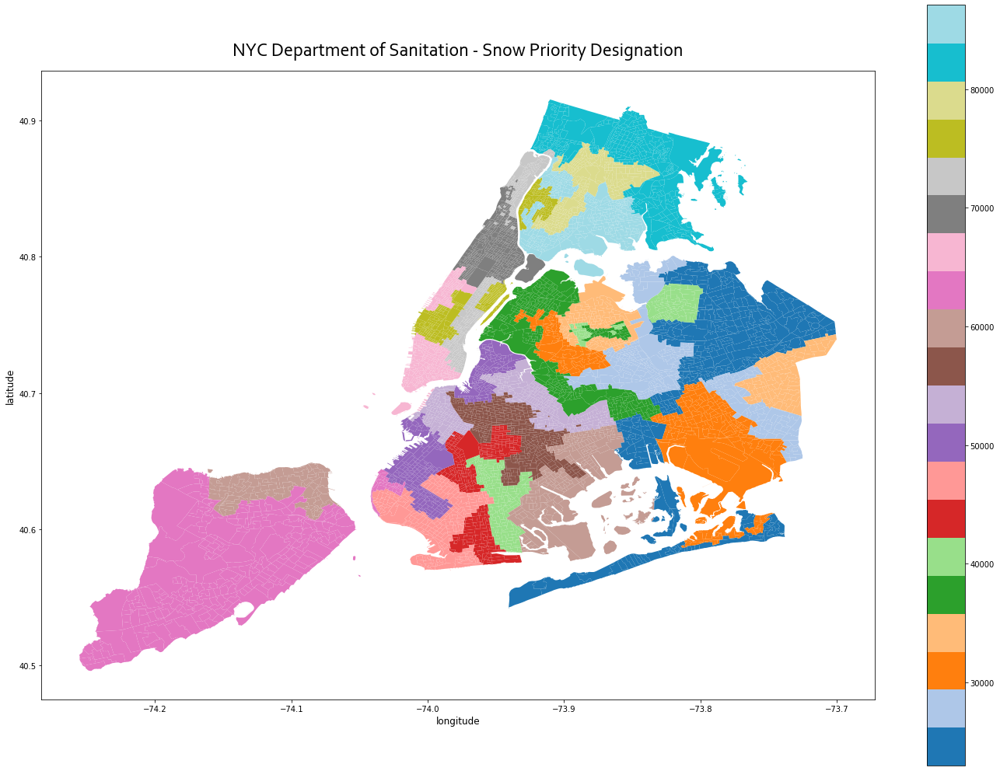

In [165]:
electionDistricts.plot(column='elect_dist',figsize=(24, 18), cmap = 'tab20', legend=True);
plt.title("Election Districts", fontdict={"family":"Corbel"}, pad=20, fontname="Corbel", size=24);
plt.ylabel("latitude", fontsize=12);
plt.xlabel("longitude", fontsize=12);